<a href="https://colab.research.google.com/github/MontserratAnaMiranda/NoteBooks_images/blob/main/EnergyEfficiency2rolling_131124.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Conection to google drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Loading libraries

In [2]:
# Step 1: Uninstall any existing tensorflow and keras installations
!pip uninstall -y tensorflow keras

# Step 2: Install TensorFlow (specific version)
!pip install tensorflow==2.15.0

# Step 3: Restart the runtime after installation to clear any conflicts
import IPython
IPython.display.clear_output()
print("Installed TensorFlow version. Please restart the kernel to apply changes.")


Installed TensorFlow version. Please restart the kernel to apply changes.


## reiniciar sesión

In [3]:
# Step 4: Verify the TensorFlow installation and import necessary libraries
import tensorflow as tf
print("TensorFlow version:", tf.__version__)

# Import other libraries
from tensorflow.keras.models import load_model, clone_model
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from sklearn.preprocessing import MinMaxScaler
from matplotlib.dates import DayLocator, DateFormatter, HourLocator
import pickle
import plotly.express as px
import sklearn.metrics as metrics
import os
import plotly.graph_objects as go
import plotly.io as pio
from IPython.display import display

print("All imports were successful.")


TensorFlow version: 2.15.0
All imports were successful.


# Resolución incompatibilidades

montse@hpc-2 ~]$ python -m pip show keras
Name: keras
Version: 2.15.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: /home/montse/.local/lib/python3.11/site-packages
Requires:
Required-by: tensorflow
[montse@hpc-2 ~]$ python -m pip show tensorflow
Name: tensorflow
Version: 2.15.0


# Loading models: noscenario and scenario

In addition, we define the 'save_folder' where we are going to save metrics and figures

In [ ]:
#Models to pick and assign in the next code cell:

#HYBRID MODEL

#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_mix_20240918_103048'
#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_mix_20240930_110839'

#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_173231'
#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_175921'
#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240918_104548'

#NONHYBRID MODELS

#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_20240917_172928'
#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_20240917_175920'
#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_20240918_115618'

#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_E_20240917_173123'
#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_E_20240917_175920'


#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_mix_20240917_173308'
#path_name0 = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_mix_20240917_180000'




In [4]:
# Define paths for each model:

#***nonscenario***

#path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_175921'

#path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_104548'


#path_name_noscenario ='/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_mix_20240917_180000'


path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_173231'

#path_name_noscenario ='/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_E_20240917_173123'

#path_name_noscenario ='/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_20240918_115618'

#path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_173231'

#path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_20240930_110839'

#path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_20240917_172928'

#path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_mix_20240918_103048'

#path_name_noscenario ='/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_20240917_172928'

#***scenario***

#path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_175921'

#path_name_noscenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_104548'


path_name_scenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_173231'

#path_name_scenario = '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_mix_20240918_103048'

# Extract the folder validation name from the scenario model

# Extract directory and model name from the path
directory, model_name = os.path.split(path_name_scenario)

# Construct the validation folder path
validation_folder = os.path.join(
    os.path.dirname(directory),
    'predictions',
    model_name.rsplit('_', 1)[0] + '_validation'
)

# Ensure the validation folder exists, create it if it doesn't
if not os.path.exists(validation_folder):
    print(f"Warning: The validation folder '{validation_folder}' does not exist. Creating it now...")
    os.makedirs(validation_folder)  # Create the folder
    print(f"Folder '{validation_folder}' has been created.")
else:
    print(f"The validation folder '{validation_folder}' exists.")

# Print the generated validation folder path
print("Validation Folder Path:", validation_folder)

def load_model_and_data(path_name):
    # Remove timestamp from path to get the model folder name
    remove = '_' + path_name.split('_')[-2] + '_' + path_name.split('_')[-1]
    path_name_base = path_name.replace(remove, '')
    model_folder_name = os.path.basename(path_name_base)

    print('model_folder_name:', model_folder_name)

    # Define the save folder path
    save_folder = os.path.join('/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions', f"{model_folder_name}_validation")
    os.makedirs(save_folder, exist_ok=True)
    print('save_folder:', save_folder)

    # Define model path based on folder name
    model_path = os.path.join(path_name, f"{model_folder_name}.h5")
    print('model_path:', model_path)

    # Load the model
    model = load_model(model_path)
    print(f"Model loaded from {model_path}")
    model.summary()

    # Check if the model has non-default weights
    new_model = clone_model(model)
    new_model.build(model.input_shape)
    weights_loaded_model = model.get_weights()
    weights_new_model = new_model.get_weights()
    trained = any(np.any(w1 != w2) for w1, w2 in zip(weights_loaded_model, weights_new_model))

    print("The model has been trained." if trained else "The model has not been trained.")
    print("")

    # Construct the .pkl file path and load it
    pkl_file_path = os.path.join(path_name, f"{model_folder_name}.pkl")
    print('pkl_file_path:', pkl_file_path)
    with open(pkl_file_path, 'rb') as pkl_file:
        loaded_list = pickle.load(pkl_file)

    print('loaded_list.keys():', loaded_list.keys())
    simul_data_df = loaded_list['df_all']
    past_history = loaded_list['past_history']
    future_target = loaded_list['future_target']

    # Return loaded_list along with other values
    return model, simul_data_df, past_history, future_target, save_folder, loaded_list

# Load models and data for noscenario and scenario separately
model_noscenario, simul_data_df_noscenario, past_history_noscenario, future_target_noscenario, validation_folder, loaded_list_noscenario = load_model_and_data(path_name_noscenario)
model_scenario, simul_data_df_scenario, past_history_scenario, future_target_scenario, validation_folder, loaded_list_scenario = load_model_and_data(path_name_scenario)

# Access loaded_list directly for plotting
print("\nKeys in loaded_list for noscenario:", loaded_list_noscenario.keys())
print("\nKeys in loaded_list for scenario:", loaded_list_scenario.keys())


The validation folder '/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_validation' exists.
Validation Folder Path: /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_20240917_validation
model_folder_name: model_3layers_10epochs_02dropout_linearactiv_3days_ep_E
save_folder: /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_ep_E_validation
model_path: /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days_ep_E_20240917_173123/model_3layers_10epochs_02dropout_linearactiv_3days_ep_E.h5
Model loaded from /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/saved_models/model_3layers_10epochs_02dropout_linearactiv_3days

# Plotting training (simulated) data

In [5]:
import plotly.express as px

### Plot training data Total Heat Consumption for noscenario
if 'heatdemand_total' in loaded_list_noscenario['df_all'].columns:
    fig = px.line(loaded_list_noscenario['df_all'], x=loaded_list_noscenario['df_all'].index, y='heatdemand_total', title='Total Heat Demand (kWh) - Trained data (Noscenario)')
elif 'E_heatdemand_total' in loaded_list_noscenario['df_all'].columns:
    fig = px.line(loaded_list_noscenario['df_all'], x=loaded_list_noscenario['df_all'].index, y='E_heatdemand_total', title='Total Heat Demand (kWh) - Trained data (Noscenario)')
else:
    raise ValueError("Neither 'heatdemand_total' nor 'E_heatdemand_total' columns are present in the DataFrame")

fig.update_xaxes(rangeslider_visible=True)
fig.update_xaxes(tickformat='%Y-%m-%d (%a) %H:%M:%S')
fig.show()


In [6]:
### Plot training data Total Heat Consumption for scenario
if 'heatdemand_total' in loaded_list_scenario['df_all'].columns:
    fig = px.line(loaded_list_scenario['df_all'], x=loaded_list_scenario['df_all'].index, y='heatdemand_total', title='Total Heat Demand (kWh) - Trained data (Scenario)')
elif 'E_heatdemand_total' in loaded_list_scenario['df_all'].columns:
    fig = px.line(loaded_list_scenario['df_all'], x=loaded_list_scenario['df_all'].index, y='E_heatdemand_total', title='Total Heat Demand (kWh) - Trained data (Scenario)')
else:
    raise ValueError("Neither 'heatdemand_total' nor 'E_heatdemand_total' columns are present in the DataFrame")

fig.update_xaxes(rangeslider_visible=True)
fig.update_xaxes(tickformat='%Y-%m-%d (%a) %H:%M:%S')
fig.show()


# Rolling prediction functions: noscenario and scenario


* Without saving inside (predicting future days)

In [7]:
def rolling_prediction_return_noscenario(dataset, start_date, end_date, model, f_scaler, multivariate_data_multitarget, future_days=2, past_history=288):
    # Define future target and history start date
    future_target = future_days * 96

    # Update: Adjust past history start date to include 3 days
    past_history_start_date = (pd.to_datetime(start_date) - pd.Timedelta(days=3)).strftime('%Y-%m-%d')

    #past_history_start_date = (pd.to_datetime(start_date) - pd.Timedelta(days=past_history // 96)).strftime('%Y-%m-%d')

    subset_query = f'date_time.between("{past_history_start_date} 00:00:00", "{end_date} 23:45:00")'
    df_test = dataset.query(subset_query)

     # DEBUG: Print the size of the dataset being used
    print(f"Requested range: {past_history_start_date} to {end_date}")
    print(f"Available data points in queried dataset: {len(df_test)}")

    if len(df_test) < past_history + future_target:
        raise ValueError("Insufficient data in the dataset for the requested past history and future prediction range.")

    scaler, df_test_scaled = f_scaler(df_test)
    # Dataset split (features and target)
    X, y = df_test_scaled.iloc[:, :-1].values, df_test_scaled.iloc[:, -1:].values

    X_test, y_test = multivariate_data_multitarget(X, y, 0, None, past_history, 96, step=1, single_step=False)

    rolling_predictions = []
    input_window = X_test[:1]
    # Rolling prediction loop to accumulate eg. 5 days (480 steps)
    for _ in range(future_days):
        y_model0 = model.predict(input_window)
        print(f'y_model0.shape (predicting 96 steps): {y_model0.shape}')
        rolling_predictions.append(y_model0.flatten())
        y_model_expanded = np.repeat(y_model0.reshape(96, 1), input_window.shape[2], axis=1)
        input_window = np.roll(input_window, -96, axis=1)
        input_window[:, -96:, :] = y_model_expanded.reshape(1, 96, input_window.shape[2])

    rolling_predictions = np.concatenate(rolling_predictions)
    y_model1 = rolling_predictions.reshape(-1, 1)
    selected_scalers = dict(list(scaler.items())[-1:])
    y_model_O1 = selected_scalers[list(selected_scalers.keys())[0]].inverse_transform(y_model1).flatten()
    predicted_time_range = pd.date_range(start=pd.to_datetime(start_date), periods=future_target, freq='15T')


    #***** Calculate Metrics

    mae = metrics.mean_absolute_error(y_test[0].flatten(), y_model1[:96])
    rmse = np.sqrt(metrics.mean_squared_error(y_test[0].flatten(), y_model1[:96]))
    r_squared = np.corrcoef(y_test[0].flatten(), y_model1[:96].flatten())[0, 1] ** 2
    nmbe = np.mean(y_test[0].flatten() - y_model1[:96]) / np.mean(y_test[0].flatten()) * 100
    cvrmse = rmse / np.mean(y_test[0].flatten()) * 100

    metrics_noscenario_dict = {
        'Metric': ['Mean Absolute Error (MAE)', 'Root Mean Squared Error (RMSE)', "R²", 'NMBE', 'CVRMSE'],
        'Value': [mae, rmse, r_squared, nmbe, cvrmse]
    }
    metrics_noscenario_df = pd.DataFrame(metrics_noscenario_dict)
    print("\nMetrics Table:")
    display(metrics_noscenario_df)

    file_path = os.path.join(validation_folder, f'metrics_noscenario_{start_date}_{end_date}.csv')
    metrics_noscenario_df.to_csv(file_path, index=False)


    # Plot predictions (Single Target)
    plt.rcParams.update({'font.size': 12})
    fig2, ax2 = plt.subplots(figsize=(10, 5))
    ax2 = plt.gca()  # Get the current axis

    target_column = df_test.columns[-1]  # Example: 'heatdemand_total'
    print("Target column: ", target_column)

    # Get the index of the target column
    index_of_target_column = df_test.columns.get_loc(target_column) if target_column else None
    print("The index of the target column is", index_of_target_column)

    # Ensure we have data in both test and prediction datasets
    if len(df_test) > 0 and len(y_model_O1) > 0:
        # Plot test data (actual) vs predicted data
        ax2.plot(df_test.index[:past_history + future_target], df_test.iloc[:past_history + future_target, index_of_target_column], label="Test data", color="g")
        ax2.plot(df_test.index[past_history:past_history + len(y_model_O1)], y_model_O1, label="Prediction", color="orange")

        ax2.set_title('Model prediction results')
        ax2.set_ylabel('Heat Demand')

        # Place legend
        ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), ncol=2, shadow=True)

        # Customizing the x-axis labels
        ax2.xaxis.set_major_locator(DayLocator())
        date_formatter = DateFormatter("%Y-%m-%d (%a)")
        ax2.xaxis.set_major_formatter(date_formatter)

        # Rotate x-axis labels
        plt.xticks(rotation=45)

        # Save and show plot
        fig2.savefig(os.path.join(validation_folder, f"predictions_nonscenario_{start_date}_{end_date}.png"), bbox_inches='tight')
        plt.show()
    else:
        print("No data available for plotting.")

    ### Return predictions as a vector and corresponding time range
    return y_model_O1, predicted_time_range

def rolling_prediction_return_scenario(dataset, start_date, end_date, model, f_scaler, multivariate_data_multitarget, future_days=2, past_history=288):
    # Function body is similar to rolling_prediction_return_noscenario, adapted for scenario
    future_target = future_days * 96

     # Update: Adjust past history start date to include 3 days
    past_history_start_date = (pd.to_datetime(start_date) - pd.Timedelta(days=3)).strftime('%Y-%m-%d')
    #past_history_start_date = (pd.to_datetime(start_date) - pd.Timedelta(days=past_history // 96)).strftime('%Y-%m-%d')

    subset_query = f'date_time.between("{past_history_start_date} 00:00:00", "{end_date} 23:45:00")'
    df_test = dataset.query(subset_query)


     # DEBUG: Print the size of the dataset being used
    print(f"Requested range: {past_history_start_date} to {end_date}")
    print(f"Available data points in queried dataset: {len(df_test)}")

    if len(df_test) < past_history + future_target:
        raise ValueError("Insufficient data in the dataset for the requested past history and future prediction range.")

    scaler, df_test_scaled = f_scaler(df_test)
    # Dataset split (features and target)
    X, y = df_test_scaled.iloc[:, :-1].values, df_test_scaled.iloc[:, -1:].values

    X_test, y_test = multivariate_data_multitarget(X, y, 0, None, past_history, 96, step=1, single_step=False)

    rolling_predictions = []
    input_window = X_test[:1]
    # Rolling prediction loop to accumulate eg. 5 days (480 steps)
    for _ in range(future_days):
        y_model0 = model.predict(input_window)
        print(f'y_model0.shape (predicting 96 steps): {y_model0.shape}')
        rolling_predictions.append(y_model0.flatten())
        y_model_expanded = np.repeat(y_model0.reshape(96, 1), input_window.shape[2], axis=1)
        input_window = np.roll(input_window, -96, axis=1)
        input_window[:, -96:, :] = y_model_expanded.reshape(1, 96, input_window.shape[2])

    rolling_predictions = np.concatenate(rolling_predictions)
    y_model1 = rolling_predictions.reshape(-1, 1)
    selected_scalers = dict(list(scaler.items())[-1:])
    y_model_O1 = selected_scalers[list(selected_scalers.keys())[0]].inverse_transform(y_model1).flatten()
    predicted_time_range = pd.date_range(start=pd.to_datetime(start_date), periods=future_target, freq='15T')

    #***** Calculate Metrics

    mae = metrics.mean_absolute_error(y_test[0].flatten(), y_model1[:96])
    rmse = np.sqrt(metrics.mean_squared_error(y_test[0].flatten(), y_model1[:96]))
    r_squared = np.corrcoef(y_test[0].flatten(), y_model1[:96].flatten())[0, 1] ** 2
    nmbe = np.mean(y_test[0].flatten() - y_model1[:96]) / np.mean(y_test[0].flatten()) * 100
    cvrmse = rmse / np.mean(y_test[0].flatten()) * 100

    metrics_scenario_dict = {
        'Metric': ['Mean Absolute Error (MAE)', 'Root Mean Squared Error (RMSE)', "R²", 'NMBE', 'CVRMSE'],
        'Value': [mae, rmse, r_squared, nmbe, cvrmse]
    }
    metrics_scenario_df = pd.DataFrame(metrics_scenario_dict)
    print("\nMetrics Table:")
    display(metrics_scenario_df)

    file_path = os.path.join(validation_folder, f'metrics_scenario_{start_date}_{end_date}.csv')
    metrics_scenario_df.to_csv(file_path, index=False)




    # Plot predictions (Single Target)
    plt.rcParams.update({'font.size': 12})
    fig2, ax2 = plt.subplots(figsize=(10, 5))
    ax2 = plt.gca()  # Get the current axis

    target_column = df_test.columns[-1]  # Example: 'heatdemand_total'
    print("Target column: ", target_column)

    # Get the index of the target column
    index_of_target_column = df_test.columns.get_loc(target_column) if target_column else None
    print("The index of the target column is", index_of_target_column)

    # Ensure we have data in both test and prediction datasets
    if len(df_test) > 0 and len(y_model_O1) > 0:
        # Plot test data (actual) vs predicted data
        ax2.plot(df_test.index[:past_history + future_target], df_test.iloc[:past_history + future_target, index_of_target_column], label="Test data", color="g")
        ax2.plot(df_test.index[past_history:past_history + len(y_model_O1)], y_model_O1, label="Prediction", color="orange")

        ax2.set_title('Model prediction results')
        ax2.set_ylabel('Heat Demand')

        # Place legend
        ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), ncol=2, shadow=True)

        # Customizing the x-axis labels
        ax2.xaxis.set_major_locator(DayLocator())
        date_formatter = DateFormatter("%Y-%m-%d (%a)")
        ax2.xaxis.set_major_formatter(date_formatter)

        # Rotate x-axis labels
        plt.xticks(rotation=45)

        # Save and show plot
        fig2.savefig(os.path.join(validation_folder, f"predictions_scenario_{start_date}_{end_date}.png"), bbox_inches='tight')
        plt.show()
    else:
        print("No data available for plotting.")

    ### Return predictions as a vector and corresponding time range
    return y_model_O1, predicted_time_range


# Other functions: scaler and multivariate_data_multitarget

In [8]:
def f_scaler(df):
    scalers = {}
    df_scaled = pd.DataFrame()
    for column in df.columns:
        scaler = MinMaxScaler()
        #scaler = StandardScaler()
        #scaler = RobustScaler()
        column_scaled = scaler.fit_transform(df[[column]])
        df_scaled[column] = column_scaled.flatten()
        scalers[column] = scaler

    return scalers, df_scaled

def multivariate_data_multitarget(dataset
                      , target
                      , start_index # tipicaly 0 for train and "train_end_index" for test
                      , end_index # tipicaly "none" for test
                      , history_size # past observations to be considered
                      , target_size # future observations associated to history
                      , step # gap data (explanation below)
                      , single_step=False): # whether to predict a single or multiple points
    data = []
    labels = []

    start_index = start_index + history_size
    if end_index is None:
        end_index = len(dataset) - target_size

    for i in range(start_index, end_index):
        indices = range(i-history_size, i, step)
        data.append(dataset[indices, :])

        if single_step:
            # label = a data point
            labels.append(target[(i+target_size), :])
        else:
            # label = a sequence
            # labels.append(target[i:i+target_size, :])
            # print(len(np.array(target[i:i+target_size, :]).reshape(1,-1)))
            labels.append(np.array(target[i:i+target_size, :]).reshape(-1,1))

    return np.array(data), np.array(labels)

#  Loading ep data (standard) to create the baseline from 22-12-2023 to 31-01-2024


This would include the real meteo data and the usual variables.

2024_simul_CALI_data.csv


Preprocessing (Mabel) in read_2024_simulated_cali_data.ipynb

In [21]:
ep_data = pd.read_csv("/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/ep_data/2024_simulated_CALI_data_fixed.csv")
ep_data.columns

Index(['date_time', 'eptemp_SALAPROFESORES', 'eptemp_DESPACHOX1',
       'eptemp_DESPACHOX2', 'eptemp_DESPACHOX3', 'eptemp_SALAREUNIONESDECANO',
       'eptemp_DESPACHODECANO', 'eptemp_DESPACHOVICEDECANO',
       'eptemp_DESPACHOX4', 'eptemp_DESPACHOX5', 'eptemp_DESPACHOCAPELLAN',
       'eptemp_SECRETARIA', 'eptemp_DX9', 'simheat_SALAPROFESORES',
       'simheat_DESPACHOX1', 'simheat_DESPACHOX2', 'simheat_DESPACHOX3',
       'simheat_SALAREUNIONESDECANO', 'simheat_DESPACHODECANO',
       'simheat_DESPACHOVICEDECANO', 'simheat_DESPACHOX4',
       'simheat_DESPACHOX5', 'simheat_DESPACHOCAPELLAN', 'simheat_SECRETARIA',
       'simheat_DX9', 'simheatdemand_total', 'Dry Bulb Temperature',
       'Global Horizontal Radiation', 'Relative Humidity',
       'Liquid Precipitation Depth', 'Wind Direction', 'Wind Speed',
       'is_holiday', 'simsetheat_SALAPROFESORES', 'simsetheat_DESPACHOX1',
       'simsetheat_DESPACHOX2', 'simsetheat_DESPACHOX3',
       'simsetheat_SALAREUNIONESDECANO', 'sims

In [24]:
columns_training

['Dry Bulb Temperature',
 'Global Horizontal Radiation',
 'Relative Humidity',
 'Liquid Precipitation Depth',
 'Wind Direction',
 'Wind Speed',
 'E_eptemp_SALAPROFESORES',
 'E_eptemp_DESPACHOX1',
 'E_eptemp_DESPACHOX2',
 'E_eptemp_DESPACHOX3',
 'E_eptemp_SALAREUNIONESDECANO',
 'E_eptemp_DESPACHODECANO',
 'E_eptemp_DESPACHOVICEDECANO',
 'E_eptemp_DESPACHOX4',
 'E_eptemp_DESPACHOX5',
 'E_eptemp_SECRETARIA',
 'E_eptemp_DX9',
 'E_eptemp_DESPACHOCAPELLAN',
 'is_holiday',
 'E_setpoint_heat_DESPACHOX2',
 'E_setpoint_heat_SECRETARIA',
 'E_setpoint_heat_SALAPROFESORES',
 'E_heatdemand_total']

In [26]:
# Load ep_data
ep_data = pd.read_csv("/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/ep_data/2024_simulated_CALI_data_fixed.csv")

# Use the appropriate loaded list, e.g., loaded_list_noscenario for noscenario data
columns_training = list(loaded_list_noscenario['df_all'].columns)
print('Variables used for training:', columns_training)

### Transform columns to match ep_data naming conventions
# Apply specific transformations to match target columns in ep_data
columns_test = [
    item.replace('E_brcm_', 'eptemp_')
        .replace('E_eptemp_', 'eptemp_')
        .replace('E_setpoint_heat_', 'simsetheat_')
        .replace('E_heatdemand_total', 'simheatdemand_total')  # Corrected to match ep_data
    for item in columns_training
]

# Display each transformation result for clarity
for original, transformed in zip(columns_training, columns_test):
    print(f"Transformed '{original}' to '{transformed}'")

# Verify if each transformed column exists in ep_data
missing_columns = [col for col in columns_test if col not in ep_data.columns]
print('\nMissing columns in ep_data:', missing_columns)

# Filter only columns that are actually present in ep_data
columns_test = [col for col in columns_test if col in ep_data.columns]
print('\nFiltered columns for testing:', columns_test)

# Create the subset ep_data_df with the transformed columns
ep_data_df = ep_data[columns_test].copy()

# Convert 'date_time' to datetime format and set as the index
ep_data_df['date_time'] = pd.to_datetime(ep_data['date_time'])
ep_data_df = ep_data_df.set_index('date_time')

# Filter for the specific date range
start_date = "2023-12-22"
end_date = "2024-01-31"
ep_data_df = ep_data_df.loc[start_date:end_date]

### Final check of variable alignment
print('\nFinal check of variables in both dataframes:')
print('Variables used for training:', columns_training)
print('Variables in ep_data_df:', list(ep_data_df.columns))


Variables used for training: ['Dry Bulb Temperature', 'Global Horizontal Radiation', 'Relative Humidity', 'Liquid Precipitation Depth', 'Wind Direction', 'Wind Speed', 'E_eptemp_SALAPROFESORES', 'E_eptemp_DESPACHOX1', 'E_eptemp_DESPACHOX2', 'E_eptemp_DESPACHOX3', 'E_eptemp_SALAREUNIONESDECANO', 'E_eptemp_DESPACHODECANO', 'E_eptemp_DESPACHOVICEDECANO', 'E_eptemp_DESPACHOX4', 'E_eptemp_DESPACHOX5', 'E_eptemp_SECRETARIA', 'E_eptemp_DX9', 'E_eptemp_DESPACHOCAPELLAN', 'is_holiday', 'E_setpoint_heat_DESPACHOX2', 'E_setpoint_heat_SECRETARIA', 'E_setpoint_heat_SALAPROFESORES', 'E_heatdemand_total']
Transformed 'Dry Bulb Temperature' to 'Dry Bulb Temperature'
Transformed 'Global Horizontal Radiation' to 'Global Horizontal Radiation'
Transformed 'Relative Humidity' to 'Relative Humidity'
Transformed 'Liquid Precipitation Depth' to 'Liquid Precipitation Depth'
Transformed 'Wind Direction' to 'Wind Direction'
Transformed 'Wind Speed' to 'Wind Speed'
Transformed 'E_eptemp_SALAPROFESORES' to 'eptemp

## Plotting epdata to create baseline

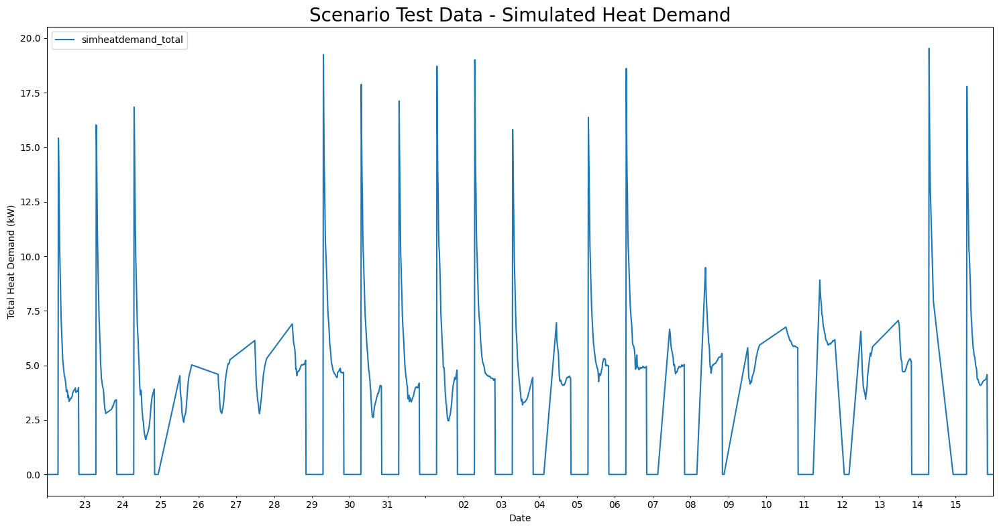

In [27]:
import matplotlib.pyplot as plt
from matplotlib.dates import DayLocator, DateFormatter

# Create the figure and axis for plotting
fig, ax = plt.subplots(figsize=(15, 8))

# Plot the data for 'simheatdemand_total' in the specified DataFrame (assuming `ep_data_df` is the correct DataFrame)
ep_data_df.plot(ax=ax, y='simheatdemand_total', title='Simulated Heat Demand')

# Set axis labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Total Heat Demand (kW)')
plt.title('Scenario Test Data - Simulated Heat Demand', fontsize=20)

# Customize x-axis to show date only in the desired format
ax.xaxis.set_major_locator(DayLocator())  # Set major ticks for each day
date_formatter = DateFormatter('%Y-%m-%d')  # Format date to show only YYYY-MM-DD
ax.xaxis.set_major_formatter(date_formatter)  # Apply date formatter

# Rotate x-axis labels for readability and set font size
plt.xticks(rotation=45, ha='right', fontsize=10)

# Apply tight layout and display the plot
plt.tight_layout()
plt.show()


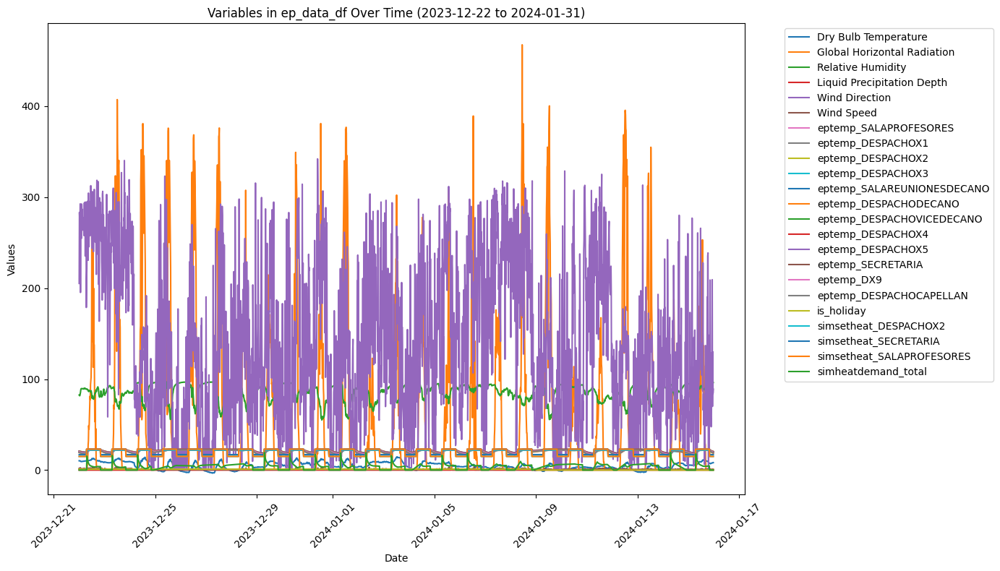

In [28]:
# Plot each column in `ep_data_df` over time
plt.figure(figsize=(14, 8))  # Set the figure size

# Plotting each column individually on the same graph for comparison
for column in ep_data_df.columns:
    plt.plot(ep_data_df.index, ep_data_df[column], label=column)

# Set labels and title
plt.xlabel("Date")
plt.ylabel("Values")
plt.title("Variables in ep_data_df Over Time (2023-12-22 to 2024-01-31)")

# Show legend and plot
plt.legend(loc="best", bbox_to_anchor=(1.05, 1))
plt.xticks(rotation=45)
plt.tight_layout()  # Adjust layout for better fit
plt.show()


# Loading real (standard and scenario) data from 22-12-2023 to 31-01-2024

In [29]:
### Load real data
real_data = pd.read_csv("/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/real_data/decanato_real_data_2023-12-22to2024-01-31.csv")

# Use the appropriate loaded list, e.g., loaded_list_noscenario for noscenario data
columns_training = list(loaded_list_noscenario['df_all'].columns)
print('Variables used for training: ', columns_training)

### Subset real data dataframe to leave variables used for training
# Adjust column names to match real data naming conventions
columns_test = [item.replace('E_', '') for item in columns_training]
columns_test = [item.replace('brcm', 'realtemp') for item in columns_test]
columns_test = [item.replace('eptemp', 'realtemp') for item in columns_test]
columns_test = [item.replace('setpoint_heat', 'realsetheat') for item in columns_test]
columns_test = [item.replace('heatdemand_total', 'realtotal_energia') for item in columns_test]

### Subset real data dataframe and make an explicit copy
real_data_df = real_data[columns_test].copy()

# Convert 'date_time' to datetime format separately
real_data_df['date_time'] = pd.to_datetime(real_data['date_time'].values)
real_data_df = real_data_df.set_index('date_time')

### Check order of variables
print('Check order of variables in both dataframes:')
print('Variables used for training:', columns_training)
print('Variables in real data:', list(real_data_df.columns))


Variables used for training:  ['Dry Bulb Temperature', 'Global Horizontal Radiation', 'Relative Humidity', 'Liquid Precipitation Depth', 'Wind Direction', 'Wind Speed', 'E_eptemp_SALAPROFESORES', 'E_eptemp_DESPACHOX1', 'E_eptemp_DESPACHOX2', 'E_eptemp_DESPACHOX3', 'E_eptemp_SALAREUNIONESDECANO', 'E_eptemp_DESPACHODECANO', 'E_eptemp_DESPACHOVICEDECANO', 'E_eptemp_DESPACHOX4', 'E_eptemp_DESPACHOX5', 'E_eptemp_SECRETARIA', 'E_eptemp_DX9', 'E_eptemp_DESPACHOCAPELLAN', 'is_holiday', 'E_setpoint_heat_DESPACHOX2', 'E_setpoint_heat_SECRETARIA', 'E_setpoint_heat_SALAPROFESORES', 'E_heatdemand_total']
Check order of variables in both dataframes:
Variables used for training: ['Dry Bulb Temperature', 'Global Horizontal Radiation', 'Relative Humidity', 'Liquid Precipitation Depth', 'Wind Direction', 'Wind Speed', 'E_eptemp_SALAPROFESORES', 'E_eptemp_DESPACHOX1', 'E_eptemp_DESPACHOX2', 'E_eptemp_DESPACHOX3', 'E_eptemp_SALAREUNIONESDECANO', 'E_eptemp_DESPACHODECANO', 'E_eptemp_DESPACHOVICEDECANO', 'E

##  Checking equivalence between real and ep_data for the model

In [30]:
# Define expected mappings based on provided column names
expected_mappings = {
    'eptemp_': 'realtemp_',
    'simsetheat_': 'realsetheat_',
    'simheatdemand_total': 'realtotal_energia'
}

# Extract columns from both dataframes
ep_columns = list(ep_data_df.columns)
real_columns = list(real_data_df.columns)

# Verify temperature, setpoint heat, and total energy mappings
mapped_columns = []
for ep_col in ep_columns:
    matched = False
    for prefix_ep, prefix_real in expected_mappings.items():
        # Check if the column has the ep prefix and transform it to real equivalent
        if ep_col.startswith(prefix_ep):
            real_col = ep_col.replace(prefix_ep, prefix_real)
            mapped_columns.append((ep_col, real_col))
            matched = True
            break
    if not matched:
        # If no prefix replacement is needed, add as-is if it exists in real data
        mapped_columns.append((ep_col, ep_col))

# Print comparison results
print("\nComparison of ep_data_df and real_data_df columns:\n")
for ep_col, real_col in mapped_columns:
    in_real_data_df = real_col in real_columns
    status = "MATCH" if in_real_data_df else "MISSING in real_data_df"
    print(f"ep_data_df: '{ep_col}'  ->  real_data_df: '{real_col}'  : {status}")

# Check for any unmatched columns in real_data_df
unmatched_real_cols = [col for col in real_columns if col not in [mapped[1] for mapped in mapped_columns]]
if unmatched_real_cols:
    print("\nUnmatched columns in real_data_df:", unmatched_real_cols)
else:
    print("\nAll columns in real_data_df have a corresponding match in ep_data_df.")



Comparison of ep_data_df and real_data_df columns:

ep_data_df: 'Dry Bulb Temperature'  ->  real_data_df: 'Dry Bulb Temperature'  : MATCH
ep_data_df: 'Global Horizontal Radiation'  ->  real_data_df: 'Global Horizontal Radiation'  : MATCH
ep_data_df: 'Relative Humidity'  ->  real_data_df: 'Relative Humidity'  : MATCH
ep_data_df: 'Liquid Precipitation Depth'  ->  real_data_df: 'Liquid Precipitation Depth'  : MATCH
ep_data_df: 'Wind Direction'  ->  real_data_df: 'Wind Direction'  : MATCH
ep_data_df: 'Wind Speed'  ->  real_data_df: 'Wind Speed'  : MATCH
ep_data_df: 'eptemp_SALAPROFESORES'  ->  real_data_df: 'realtemp_SALAPROFESORES'  : MATCH
ep_data_df: 'eptemp_DESPACHOX1'  ->  real_data_df: 'realtemp_DESPACHOX1'  : MATCH
ep_data_df: 'eptemp_DESPACHOX2'  ->  real_data_df: 'realtemp_DESPACHOX2'  : MATCH
ep_data_df: 'eptemp_DESPACHOX3'  ->  real_data_df: 'realtemp_DESPACHOX3'  : MATCH
ep_data_df: 'eptemp_SALAREUNIONESDECANO'  ->  real_data_df: 'realtemp_SALAREUNIONESDECANO'  : MATCH
ep_data

## Corrección de datos corruptos (escenario 1)

Tras una primera corrección tenemos 417 registros en lugar de 480 por lo que se revisa interpolación y 15 minutes time indexes.

<ipython-input-31-81fe3874f41a>:16: FutureWarning:

'T' is deprecated and will be removed in a future version, please use 'min' instead.

<ipython-input-31-81fe3874f41a>:38: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



Full time range (expected 480 entries):
DatetimeIndex(['2023-12-22 00:00:00', '2023-12-22 00:15:00',
               '2023-12-22 00:30:00', '2023-12-22 00:45:00',
               '2023-12-22 01:00:00', '2023-12-22 01:15:00',
               '2023-12-22 01:30:00', '2023-12-22 01:45:00',
               '2023-12-22 02:00:00', '2023-12-22 02:15:00',
               ...
               '2023-12-26 21:30:00', '2023-12-26 21:45:00',
               '2023-12-26 22:00:00', '2023-12-26 22:15:00',
               '2023-12-26 22:30:00', '2023-12-26 22:45:00',
               '2023-12-26 23:00:00', '2023-12-26 23:15:00',
               '2023-12-26 23:30:00', '2023-12-26 23:45:00'],
              dtype='datetime64[ns]', length=480, freq='15min')

Initial data size for range 2023-12-22 to 2023-12-26 23:45:00: 417

Data size after reindexing to full time range (should be 480): 480

Final data size after interpolation and filling (expected 480): 480

Available data points in final real_data_df for the range 20

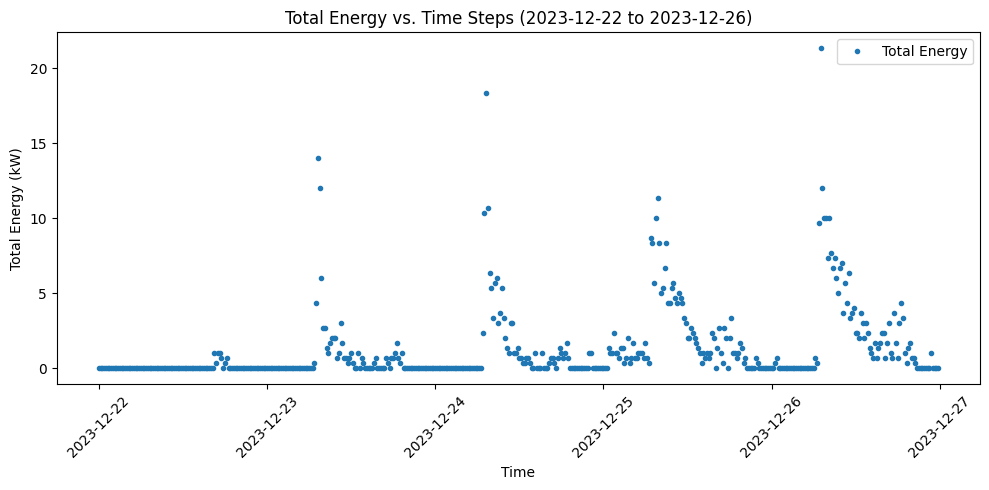

In [31]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming `real_data_df` has already been loaded

# Define the target date range to ensure exactly 480 points
start_date_fix = "2023-12-22"
end_date_fix = "2023-12-26 23:45:00"  # Explicitly include full 5 days with all intervals

# Ensure `date_time` is set as the index if not already
if 'date_time' in real_data_df.columns:
    real_data_df['date_time'] = pd.to_datetime(real_data_df['date_time'])
    real_data_df.set_index('date_time', inplace=True)

# Define the complete time range for the 5 days at 15-minute intervals (480 points)
full_time_range = pd.date_range(start=start_date_fix, end=end_date_fix, freq='15T')
print("Full time range (expected 480 entries):")
print(full_time_range)

# Print the size of the original dataset in the target date range before reindexing
initial_filtered_data = real_data_df.loc[start_date_fix:end_date_fix]
print(f"\nInitial data size for range {start_date_fix} to {end_date_fix}: {len(initial_filtered_data)}")

# Reindex to include all time points, setting any new ones to NaN
filtered_data = initial_filtered_data.reindex(full_time_range)

# Print the size of the dataset after reindexing
print(f"\nData size after reindexing to full time range (should be 480): {len(filtered_data)}")

# Separate numeric and non-numeric columns for targeted filling
numeric_data = filtered_data.select_dtypes(include=['number']).apply(pd.to_numeric, errors='coerce')
non_numeric_data = filtered_data.select_dtypes(exclude=['number'])

# Interpolate numeric data, then forward and backward fill to cover all gaps
numeric_data = numeric_data.interpolate(method='linear').ffill().bfill()

# Forward and backward fill non-numeric data to cover all gaps and address FutureWarning
non_numeric_data = non_numeric_data.ffill().bfill().infer_objects()

# Combine numeric and non-numeric data back into a single DataFrame
corrected_data = pd.concat([numeric_data, non_numeric_data], axis=1)

# Verify we have exactly 480 points after filling
print(f"\nFinal data size after interpolation and filling (expected 480): {len(corrected_data)}")

# Concatenate the original data with corrected data, dropping duplicates within the target date range
real_data_df = pd.concat([real_data_df.drop(index=full_time_range, errors='ignore'), corrected_data]).sort_index()

# Restore `date_time` as both a column and index for compatibility
real_data_df.reset_index(inplace=True)
real_data_df.rename(columns={'index': 'date_time'}, inplace=True)
real_data_df['date_time'] = pd.to_datetime(real_data_df['date_time'])
real_data_df.set_index('date_time', inplace=True)

# Optional verification of point count in the original DataFrame for the range
final_data_size = len(real_data_df.loc[start_date_fix:end_date_fix])
print(f"\nAvailable data points in final real_data_df for the range {start_date_fix} to {end_date_fix}: {final_data_size}")

# Plotting the `total energy` variable for the corrected date range
plt.figure(figsize=(10, 5))
plt.plot(corrected_data.index, corrected_data['realtotal_energia'], 'o', label='Total Energy', markersize=3)
plt.title('Total Energy vs. Time Steps (2023-12-22 to 2023-12-26)')
plt.xlabel('Time')
plt.ylabel('Total Energy (kW)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Save the corrected DataFrame to a CSV file
#corrected_file_path = '/content/corrected_decanato_real_data_2023-12-22to2024-01-31.csv'
#real_data_df.to_csv(corrected_file_path)
#print(f"Corrected data saved to {corrected_file_path}")

# Option to download the corrected file
#from google.colab import files
#files.download(corrected_file_path)


#****--------------------------------------------

**Analysis of energy efficiency strategies**

ESS1: 22-26/12/23 (inclusives) Se procede a colocar las temperaturas de consigna en todo el edificio en el mínimo valor permitido de 19ºC. Estrategias de Temperatura Mínima (ScenarioDecreto Covid).

ESS2: 27-31/12/23 (inclusives) El siguiente escenario detiene la climatización durante las horas no operativas.

ESS3: 1-6/1/24 (inclusives) El siguiente escenario pone el punto de finalización de la climatización una hora antes de lo habitual.


>> Se medirá la eficiencia energética haciendo las predicciones sobre datos Scenarioes que reproduzcan el baseline y las estrategias:


1) Read the predicted 5 days and plot for strategy input (brcm-mix)
2) Read the predicted 5 dyas and plot for baseline (ep-mix)



To generate the baseline we are going to analyse the following dates form Scenario data without scenarios:

* 8-12/01/2024
* 15-19/01/2024
* 22-26/01/24








Our priorities:

1) using a lstm_model.h5 that needs a past_history = 3 days to predict the next 24 hours.

2) We need to define at least 2 def functions: padding those input data that are less than 3 days up to 3 days, and rolling prediction

3) perform rolling prediction function. To predict the next 5 days (120 hours) so it takes the past_history = 3 days to predict the fourth day, then erases the first day from the initial 3 days history and introduces the new predicted day so we have 3 days history again to predict the fifth day, and so on.


4) At the same time we need to calculate the 5 standard metrics in efficiency by considering the predicted data for 5 days and the Standard or Scenario data that in our case represent the inputs for those 5 days.

5) In order to use past-history scenarios data upon de 5 days data from the implemented strategies in the building (3 scenarios) we are going to predict 2 days (48 h) and learn from the previous 3 days so this past-history has seen the strategies.

 Predicting 2 days from 3 days of past-history


**Scenario** is **scenario** -> **scenario**

**sim** is **Standard** (ep data) -> **noscenario**

1) Save the output with a new name

2) Generate the baseline for the same days under similar climatology

3) Plot and measure the energy reduction between the number of predicted days with 3 strategies and the number of predicted days without strategies (baseline).

4) In the code the Standard data (_noscenario) play the role of a baseline (without considering climatology only the correspondance between the week days) while _scenario play the role of the scenarios.

5) In the Standard and Scenario data there is no consumption during the weekends while during the strategies the heating is on!!!

6) Predictions begin at the start_date and learn form the previous 3 days.

7) The outpus for each scenario are:

>> simul:
>>> baselinees\*_noscenario_period.png
>>> baselinees\*_noscenario_prediction_period.csv

>> Scenario:
>>> ees\*_scenario_period.png
>>> ees\*_noscenario_prediction_period.csv




--------------------------------------

# **New131124**

For standard predictions we take ep_data_df and for scenarios real_data_df. We substitute:

* 1. ep_dat_df.query
* 2. call rolling (ep_data_df,
* 3. Fig. y = 'simheatdemand_total'



## EES1) Predict 2 days scenario 1 (using corrected data)

According to the analysis that is performed before we can see that the only two reasonable data correspond to days 25 and 26 because the previous data follow the experimentation during the set up.


Se introducen de momento todos los días porque en los que funciona bien hay problemas de datos faltantes que se deben corregir.


* Escenarios: 2023-12-22->26 (de viernes a martes)
* Noscenarios: 2024-01-08->12; 2024-01-15->19; 2024-01-22->26 (de lunes a viernes)
* Simulaciones: 2019-12-20->24 (de viernes a martes)



Standard data



,Dry Bulb Temperature,Global Horizontal Radiation,Relative Humidity,Liquid Precipitation Depth,Wind Direction,Wind Speed,eptemp_SALAPROFESORES,eptemp_DESPACHOX1,eptemp_DESPACHOX2,eptemp_DESPACHOX3,...,eptemp_DESPACHOX4,eptemp_DESPACHOX5,eptemp_SECRETARIA,eptemp_DX9,eptemp_DESPACHOCAPELLAN,is_holiday,simsetheat_DESPACHOX2,simsetheat_SECRETARIA,simsetheat_SALAPROFESORES,simheatdemand_total
date_time,,,,,,,,,,,,,,,,,,,,,
2023-12-25 00:00:00,0.798667,0.648667,96.439333,0.0,61.461333,0.473333,19.829798,21.371662,21.300310,20.844328,...,20.940531,20.802003,21.295798,20.638091,19.714706,True,15,17,15,0.493592
2023-12-25 00:15:00,0.601333,0.643333,96.484000,0.0,65.970667,0.504333,19.894485,21.387559,21.322925,20.867913,...,20.962153,20.826452,21.330577,20.662998,19.761344,True,15,17,15,0.575858
2023-12-25 00:30:00,0.642667,0.646000,96.462000,0.0,120.298667,0.478600,19.959172,21.403456,21.345540,20.891499,...,20.983775,20.850901,21.365357,20.687906,19.807983,True,15,17,15,0.658123
2023-12-25 00:45:00,0.449333,0.648667,96.399333,0.0,150.863333,0.499667,20.023858,21.419353,21.368155,20.915084,...,21.005397,20.875350,21.400137,20.712814,19.854622,True,15,17,15,0.740389
2023-12-25 01:00:00,0.464667,0.638000,96.590667,0.0,102.141333,0.543200,20.088545,21.435250,21.390770,20.938669,...,21.027018,20.899799,21.434916,20.737721,19.901260,True,15,17,15,0.822654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-26 22:45:00,-0.816667,0.614000,95.458667,0.0,2.184000,0.316000,22.923360,22.031325,22.255068,21.999906,...,22.000000,22.000000,23.000000,21.862477,21.998126,True,15,17,15,5.414657
2023-12-26 23:00:00,-1.073333,0.616667,95.609333,0.0,7.454667,0.320467,22.916393,22.030723,22.253720,21.999897,...,22.000000,22.000000,23.000000,21.861350,21.997956,True,15,17,15,5.428587
2023-12-26 23:15:00,-1.059333,0.619333,95.842667,0.0,63.648667,0.447600,22.909425,22.030120,22.252371,21.999889,...,22.000000,22.000000,23.000000,21.860223,21.997786,True,15,17,15,5.442518


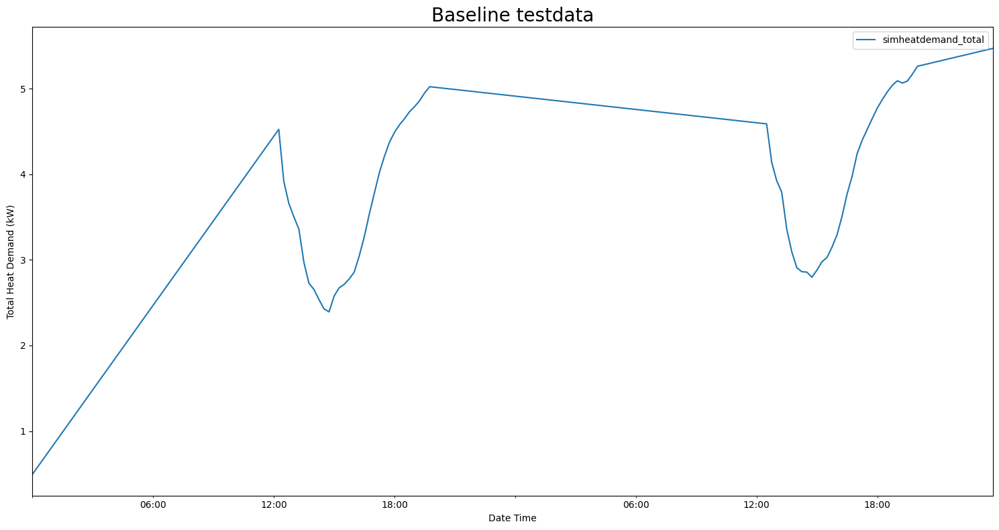

Requested range: 2023-12-22 to 2023-12-26
Available data points in queried dataset: 480
1/1 [==============================] - 1s 1s/step
y_model0.shape (predicting 96 steps): (1, 96)
1/1 [==============================] - 0s 77ms/step
y_model0.shape (predicting 96 steps): (1, 96)

Metrics Table:


<ipython-input-7-0981359a7e0a>:41: FutureWarning:

'T' is deprecated and will be removed in a future version, please use 'min' instead.



,Metric,Value
0,Mean Absolute Error (MAE),0.119768
1,Root Mean Squared Error (RMSE),0.143683
2,R²,0.052360
3,NMBE,51.193762
4,CVRMSE,74.215797


Target column:  simheatdemand_total
The index of the target column is 22


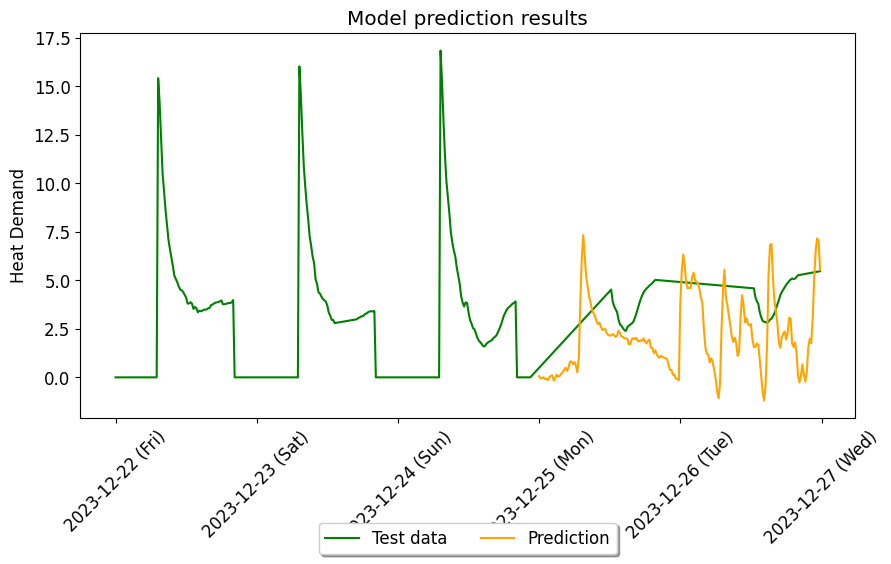

Standard predictions saved to /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_validation/baselinees1_noscenario_predictions_2023-12-25_2023-12-26.csv

Scenario data



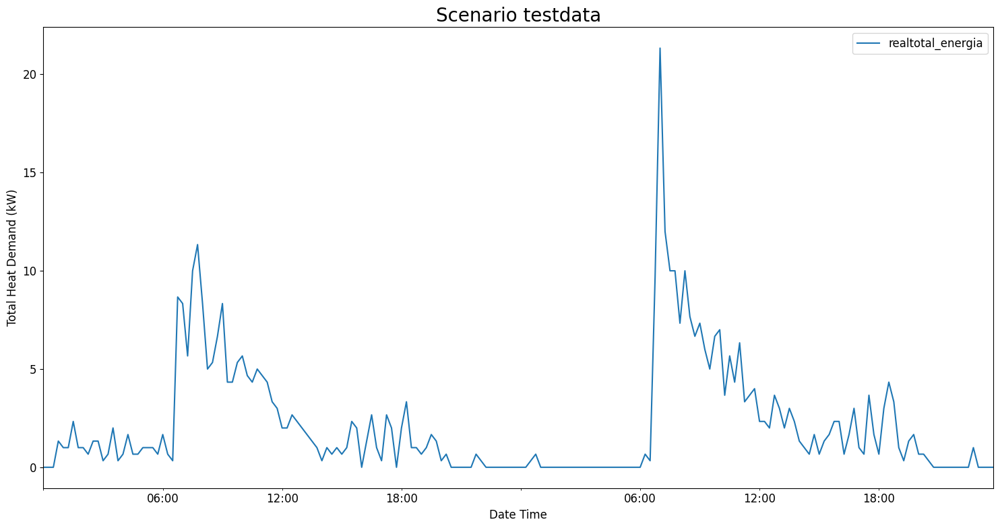

Requested range: 2023-12-22 to 2023-12-26
Available data points in queried dataset: 480
1/1 [==============================] - 2s 2s/step
y_model0.shape (predicting 96 steps): (1, 96)
1/1 [==============================] - 0s 226ms/step
y_model0.shape (predicting 96 steps): (1, 96)

Metrics Table:


<ipython-input-7-0981359a7e0a>:145: FutureWarning:

'T' is deprecated and will be removed in a future version, please use 'min' instead.



,Metric,Value
0,Mean Absolute Error (MAE),0.085137
1,Root Mean Squared Error (RMSE),0.117143
2,R²,0.167399
3,NMBE,-24.140295
4,CVRMSE,120.556483


Target column:  realtotal_energia
The index of the target column is 22


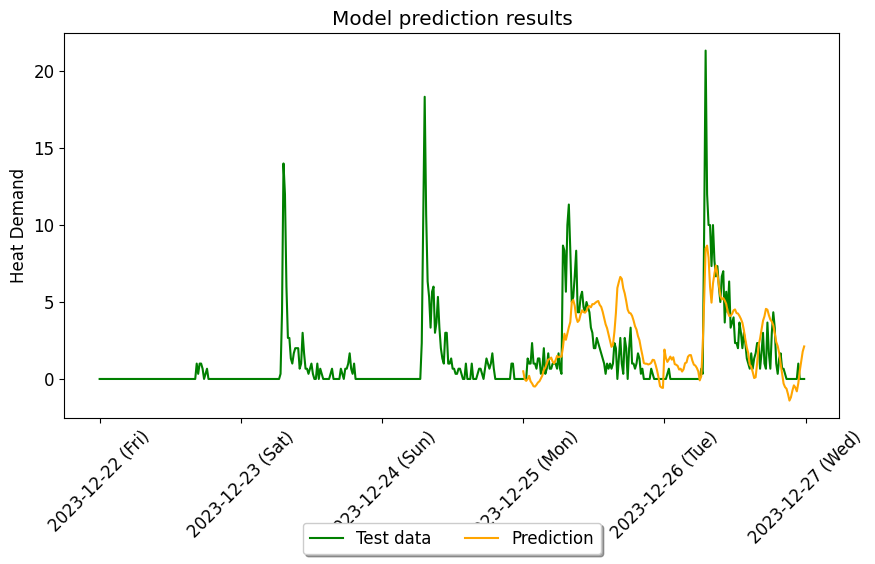

Scenario predictions saved to /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_validation/ees1_scenario_predictions_2023-12-25_2023-12-26.csv


In [32]:
# Define the date range for the Standard and Scenario data to predict 2 days from past-history = 3 days
start_date_noscenario = "2023-12-25" #datos reales sin escenarios:"2024-01-18"
end_date_noscenario = "2023-12-26"#datos reales sin escenarios: "2024-01-19"

start_date_scenario = "2023-12-25"
end_date_scenario = "2023-12-26"

# Set the number of future days for prediction (5 days = 480 steps, but using 2 days here)
future_days = 2  # Adjust as needed

# Standard data Plotting and Prediction. Now standard is ep_data_df instead of real_data_df
print("Standard data\n")
subset_query_noscenario = f'date_time.between("{start_date_noscenario} 00:00:00","{end_date_noscenario} 23:45:00")'
df_sub_noscenario = ep_data_df.query(subset_query_noscenario)
display(df_sub_noscenario)
#y_variable_noscenario = ep_data_df.columns[-1]

# Define the output file path for the Standard data
output_file_path = os.path.join(validation_folder, f"baselinees1_noscenario_testdata_{start_date_noscenario}_{end_date_noscenario}.png")

# Use matplotlib to save and display the figure for Scenario data
fig, ax = plt.subplots(figsize=(15, 8))
#df_sub_noscenario.plot(ax=ax, y='realtotal_energia', title='Baseline testdata')
df_sub_noscenario.plot(ax=ax, y='simheatdemand_total', title='Baseline testdata')
ax.set_xlabel('Date Time')
ax.set_ylabel('Total Heat Demand (kW)')
plt.title('Baseline testdata', fontsize=20)

# Customizing the x-axis labels
ax.xaxis.set_major_locator(DayLocator())  # Set ticks at the beginning of each day (00:00)
date_formatter = DateFormatter('%Y-%m-%d (%a)')  # Format date with day of the week
ax.xaxis.set_major_formatter(date_formatter)  # Set x-axis formatter

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Apply tight layout, save the plot, and display it
plt.tight_layout()
plt.savefig(output_file_path)  # Save the plot
plt.show()  # Display the plot on the screen

# ** Call rolling_prediction_return_noscenario for Standard data (2 days prediction) **
noscenario_predictions, predicted_time_range_noscenario = rolling_prediction_return_noscenario(
   ep_data_df, start_date_noscenario, end_date_noscenario, model_noscenario, f_scaler, multivariate_data_multitarget, future_days=future_days
)

# Save Standard predictions to CSV
noscenario_output_df = pd.DataFrame({'Predicted': noscenario_predictions}, index=predicted_time_range_noscenario)
noscenario_output_file = os.path.join(validation_folder, f'baselinees1_noscenario_predictions_{start_date_noscenario}_{end_date_noscenario}.csv')
noscenario_output_df.to_csv(noscenario_output_file)
print(f"Standard predictions saved to {noscenario_output_file}")

# Scenario Data Plotting and Prediction
print("\nScenario data\n")
subset_query_scenario = f'date_time.between("{start_date_scenario} 00:00:00","{end_date_scenario} 23:45:00")'
df_sub_scenario = real_data_df.query(subset_query_scenario)

# Define the output file path for the Scenario data
output_file_path = os.path.join(validation_folder, f"ees1_scenario_testdata_{start_date_scenario}_{end_date_scenario}.png")

# Use matplotlib to save and display the figure for Scenario data
fig, ax = plt.subplots(figsize=(15, 8))
df_sub_scenario.plot(ax=ax, y='realtotal_energia', title='Scenario testdata')
ax.set_xlabel('Date Time')
ax.set_ylabel('Total Heat Demand (kW)')
plt.title('Scenario testdata', fontsize=20)

# Customizing the x-axis labels
ax.xaxis.set_major_locator(DayLocator())  # Set ticks at the beginning of each day (00:00)
date_formatter = DateFormatter('%Y-%m-%d (%a)')  # Format date with day of the week
ax.xaxis.set_major_formatter(date_formatter)  # Set x-axis formatter

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Apply tight layout, save the plot, and display it
plt.tight_layout()
plt.savefig(output_file_path)  # Save the plot
plt.show()  # Display the plot on the screen

# ** Call rolling_prediction_return_scenario for Scenario data (2 days prediction) **
scenario_predictions, predicted_time_range_scenario = rolling_prediction_return_scenario(
    real_data_df, start_date_scenario, end_date_scenario, model_scenario, f_scaler, multivariate_data_multitarget, future_days=future_days
)

# Save Scenario predictions to CSV
scenario_output_df = pd.DataFrame({'Predicted': scenario_predictions}, index=predicted_time_range_scenario)
scenario_output_file = os.path.join(validation_folder, f'ees1_scenario_predictions_{start_date_scenario}_{end_date_scenario}.csv')
scenario_output_df.to_csv(scenario_output_file)
print(f"Scenario predictions saved to {scenario_output_file}")


#### Plotting predicted 2 days for scenario 1

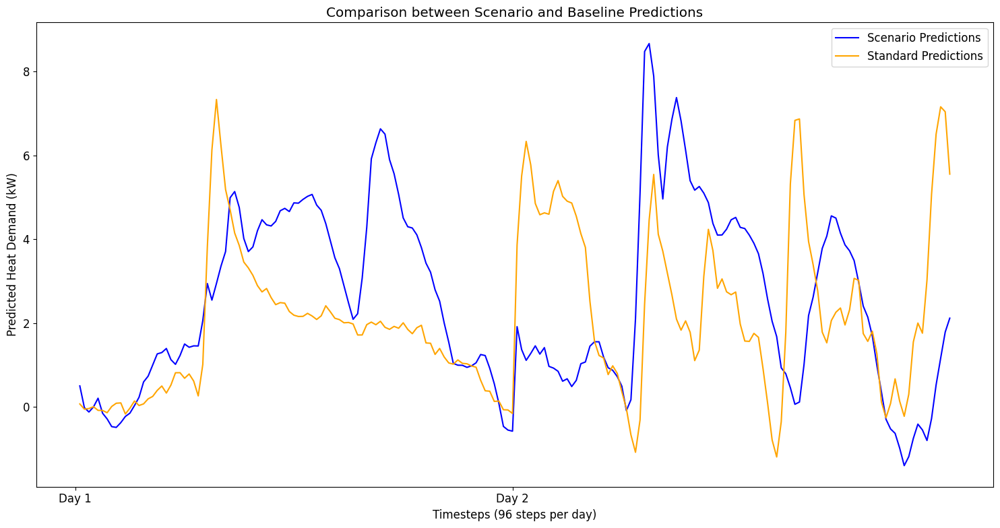

In [33]:
# Define the validation folder path
#validation_folder = os.path.join('/content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions','model_3layers_10epochs_02dropout_linearactiv_3days_brcm_mix_validation')

# Define paths to the CSV files for Scenario and Standard predictions
scenario_predictions_file = os.path.join(validation_folder,  f"ees1_scenario_predictions_{start_date_scenario}_{end_date_scenario}.csv")
noscenario_predictions_file = os.path.join(validation_folder, f"baselinees1_noscenario_predictions_{start_date_noscenario}_{end_date_noscenario}.csv")


# Check if the files exist before trying to read them
if not os.path.exists(scenario_predictions_file):
    raise FileNotFoundError(f"Error: The file '{scenario_predictions_file}' does not exist.")
if not os.path.exists(noscenario_predictions_file):
    raise FileNotFoundError(f"Error: The file '{noscenario_predictions_file}' does not exist.")

# Load Scenario and Standard predictions from CSV files
df_scenario_predictions = pd.read_csv(scenario_predictions_file, index_col=0, parse_dates=True)
df_noscenario_predictions = pd.read_csv(noscenario_predictions_file, index_col=0, parse_dates=True)

# Ensure we're only working with 3 days of data (192 timesteps for 2 days)
df_scenario_predictions = df_scenario_predictions.head(192)
df_noscenario_predictions = df_noscenario_predictions.head(192)

# Create a generic time scale for both datasets (1 to 193 timesteps)
time_labels = pd.Series([i for i in range(1, 193)])

# Plot both scenario and standard predictions
plt.figure(figsize=(15, 8))

# Plot the Scenario predictions
plt.plot(time_labels, df_scenario_predictions['Predicted'], label='Scenario Predictions', color='blue')

# Plot the Standardpredictions
plt.plot(time_labels, df_noscenario_predictions['Predicted'], label='Standard Predictions', color='orange')

# Customize the plot
plt.xlabel('Timesteps (96 steps per day)')
plt.ylabel('Predicted Heat Demand (kW)')
plt.title('Comparison between Scenario and Baseline Predictions')

# Adjust x-axis to show ticks for each day (96 timesteps per day)
#day_labels = ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5']
day_labels = ['Day 1', 'Day 2']
plt.xticks([96 * i for i in range(2)], day_labels)

# Add a legend
plt.legend()

# Apply tight layout and display the plot
plt.tight_layout()
plt.show()

#### Energy reduction between different time series (Scenario and simul)

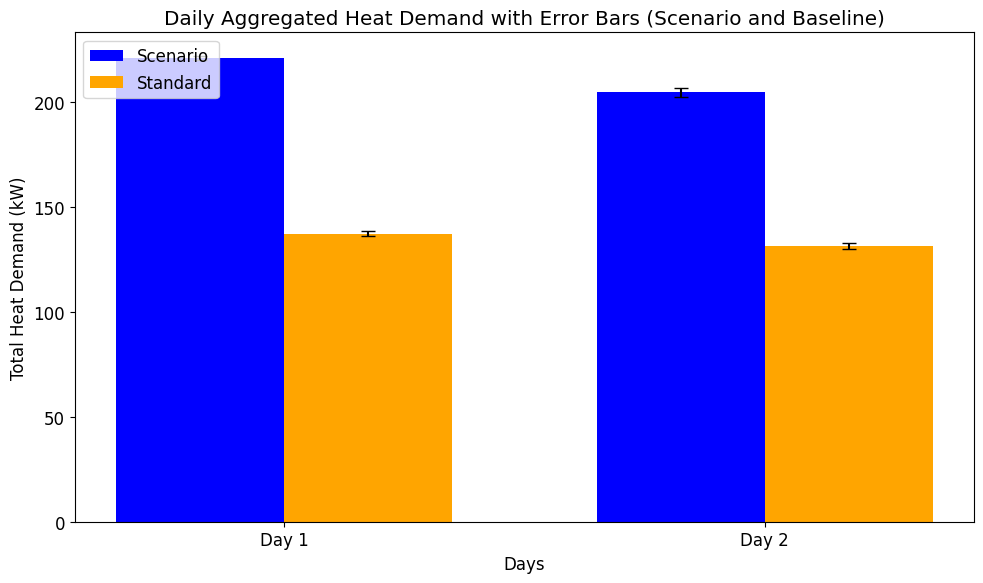


Mean Daily Energy Reduction and Associated Error:
Mean Daily Energy Reduction (%): -58.38
Mean Daily Error (%): -0.77

Daily Aggregated Heat Demand (Scenario and Baseline) with Errors:


Day,Scenario Heat Demand (kW),Scenario Standard Deviation (kW),Standard Heat Demand (kW),Standard Standard Deviation (kW),Energy Reduction (%),Reduction Error (%)
Day 1,220.95,1.11,137.23,1.28,-61.01,-0.65
Day 2,204.59,2.11,131.35,1.64,-55.75,-0.90


In [34]:
# Filter the data between 7:00 a.m. and 8:00 p.m. each day
df_scenario_filtered = df_scenario_predictions.between_time("07:00", "20:00")
df_noscenario_filtered = df_noscenario_predictions.between_time("07:00", "20:00")

# Aggregate data daily (96 timesteps per day) to get daily sum and standard deviation
df_scenario_daily = df_scenario_filtered.resample('D').agg(['sum', 'std']).iloc[:5]
df_noscenario_daily = df_noscenario_filtered.resample('D').agg(['sum', 'std']).iloc[:5]

# Renaming columns for better readability
df_scenario_daily.columns = ['Scenario Heat Demand (kW)', 'Scenario Standard Deviation (kW)']
df_noscenario_daily.columns = ['Standard Heat Demand (kW)', 'Standard Standard Deviation (kW)']

# Combine both DataFrames for comparison
df_combined = pd.concat([df_scenario_daily.reset_index(drop=True), df_noscenario_daily.reset_index(drop=True)], axis=1)

# Add Day labels and Day of the Week for clarity
#df_combined['Day of the Week'] = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_combined['Day of the Week'] = ['Day 1', 'Day 2']
# Plotting Daily Aggregated Demand with Error Bars
#days = ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5']
days = ['Day 1', 'Day 2']
width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(days))  # the label locations

# Plot Scenario and Standard data with error bars
rects1 = ax.bar(x - width/2, df_combined['Scenario Heat Demand (kW)'], width, label='Scenario',
                yerr=df_combined['Scenario Standard Deviation (kW)'], capsize=5, color='blue')
rects2 = ax.bar(x + width/2, df_combined['Standard Heat Demand (kW)'], width, label='Standard',
                yerr=df_combined['Standard Standard Deviation (kW)'], capsize=5, color='orange')

# Add labels and title
ax.set_xlabel('Days')
ax.set_ylabel('Total Heat Demand (kW)')
ax.set_title('Daily Aggregated Heat Demand with Error Bars (Scenario and Baseline)')
ax.set_xticks(x)
ax.set_xticklabels(days)
ax.legend(loc='upper left')

fig.tight_layout()
plt.show()

# --- Energy Reduction Calculation ---

# Calculate the daily energy reduction percentage and associated error
df_combined['Energy Reduction (%)'] = (
    (df_combined['Standard Heat Demand (kW)'] - df_combined['Scenario Heat Demand (kW)'])
    / df_combined['Standard Heat Demand (kW)'] * 100
)

# Error propagation for percentage reduction (simplified)
df_combined['Reduction Error (%)'] = (
    (df_combined['Standard Standard Deviation (kW)'] / df_combined['Standard Heat Demand (kW)']) ** 2 +
    (df_combined['Scenario Standard Deviation (kW)'] / df_combined['Scenario Heat Demand (kW)']) ** 2
) ** 0.5 * df_combined['Energy Reduction (%)']

# --- Mean Energy Reduction and Error ---
mean_energy_reduction = df_combined['Energy Reduction (%)'].mean()
mean_reduction_error = df_combined['Reduction Error (%)'].mean()

# Display Mean Energy Reduction and Error
print("\nMean Daily Energy Reduction and Associated Error:")
print(f"Mean Daily Energy Reduction (%): {mean_energy_reduction:.2f}")
print(f"Mean Daily Error (%): {mean_reduction_error:.2f}")

# remove the existing 'Day of the Week' column if it exists
df_combined.drop(columns=['Day of the Week'], inplace=True)

# Reinsert the 'Day' column at the first position, keeping the 'Day 1', 'Day 2', etc. labels
#df_combined.insert(0, 'Day', ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5'])
df_combined.insert(0, 'Day', ['Day 1', 'Day 2'])


# Display the modified DataFrame with the correct order of columns and without the numerical index
print("\nDaily Aggregated Heat Demand (Scenario and Baseline) with Errors:")
df_combined.style.hide(axis="index").format(precision=2)




## EES2) Predict 2 days scenario 2

* Escenarios: 2023-12-27->31 (de miércoles a domingo)
* Noscenarios: 2024-01-08->12; 2024-01-15->19; 2024-01-22->26 (de lunes a viernes)



* Simulaciones: 2019-12-25->29  (de miércoles a domingo)




Standard data



,Dry Bulb Temperature,Global Horizontal Radiation,Relative Humidity,Liquid Precipitation Depth,Wind Direction,Wind Speed,eptemp_SALAPROFESORES,eptemp_DESPACHOX1,eptemp_DESPACHOX2,eptemp_DESPACHOX3,...,eptemp_DESPACHOX4,eptemp_DESPACHOX5,eptemp_SECRETARIA,eptemp_DX9,eptemp_DESPACHOCAPELLAN,is_holiday,simsetheat_DESPACHOX2,simsetheat_SECRETARIA,simsetheat_SALAPROFESORES,simheatdemand_total
date_time,,,,,,,,,,,,,,,,,,,,,
2023-12-30 00:00:00,5.868667,0.698667,94.240667,0.0,66.548667,0.405800,18.843393,20.427575,20.364085,20.039372,...,19.986835,20.190204,20.243276,19.581782,18.919213,True,15,17,15,0.0
2023-12-30 00:15:00,5.560667,0.703333,94.356000,0.0,183.025333,0.594067,18.707402,20.326863,20.279562,19.949707,...,19.877809,20.124788,20.140799,19.469450,18.792962,True,15,17,15,0.0
2023-12-30 00:30:00,5.078667,0.692667,94.426667,0.0,25.653333,0.372200,18.573514,20.227977,20.195596,19.860793,...,19.771563,20.060240,20.040716,19.360372,18.666623,True,15,17,15,0.0
2023-12-30 00:45:00,4.778667,0.686000,94.808000,0.0,53.854000,0.572400,18.440778,20.131678,20.113229,19.773307,...,19.669216,19.996951,19.943145,19.254921,18.542699,True,15,17,15,0.0
2023-12-30 01:00:00,4.566667,0.684000,94.980000,0.0,64.244667,0.419400,18.310713,20.037476,20.031829,19.686900,...,19.569703,19.934592,19.847894,19.152056,18.419675,True,15,17,15,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 22:45:00,4.316667,0.674000,91.210667,0.0,24.582667,0.319267,19.405072,20.984812,20.837582,20.487251,...,20.595679,20.537793,20.829362,20.230438,19.458087,True,15,17,15,0.0
2023-12-31 23:00:00,4.316000,0.678000,91.397333,0.0,10.527333,0.329000,19.220216,20.868023,20.736039,20.380096,...,20.472092,20.457255,20.702090,20.086047,19.295749,True,15,17,15,0.0
2023-12-31 23:15:00,4.116667,0.674000,91.660667,0.0,40.080000,0.391733,19.051706,20.754445,20.638561,20.277304,...,20.350328,20.382056,20.579881,19.948119,19.143102,True,15,17,15,0.0


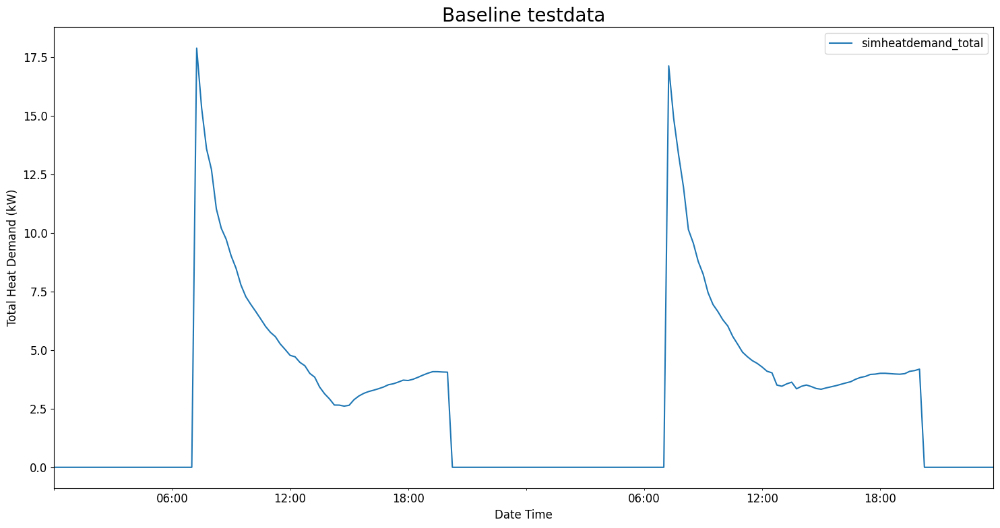

Requested range: 2023-12-27 to 2023-12-31
Available data points in queried dataset: 480
1/1 [==============================] - 0s 112ms/step
y_model0.shape (predicting 96 steps): (1, 96)
1/1 [==============================] - 0s 134ms/step
y_model0.shape (predicting 96 steps): (1, 96)

Metrics Table:


<ipython-input-7-0981359a7e0a>:41: FutureWarning:

'T' is deprecated and will be removed in a future version, please use 'min' instead.



,Metric,Value
0,Mean Absolute Error (MAE),0.125296
1,Root Mean Squared Error (RMSE),0.195297
2,R²,0.500903
3,NMBE,69.194965
4,CVRMSE,124.851374


Target column:  simheatdemand_total
The index of the target column is 22


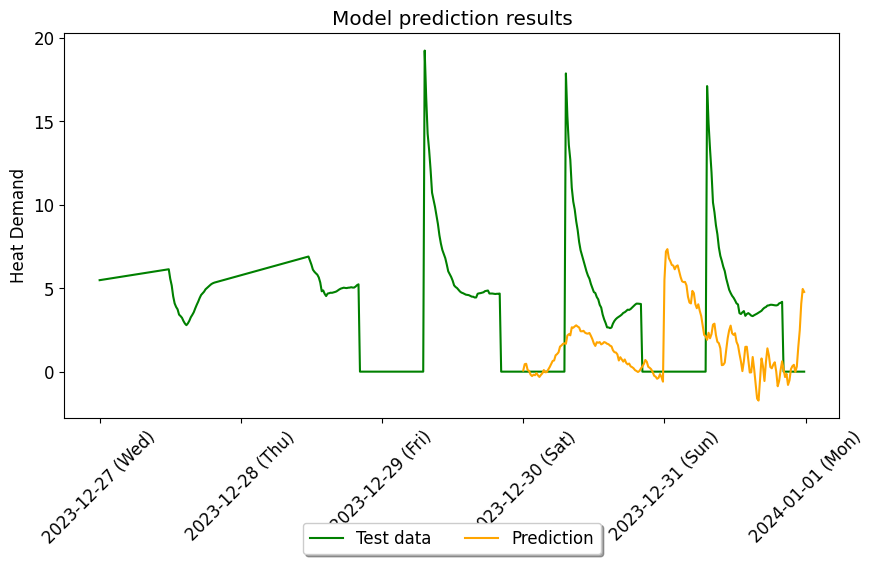

Standard predictions saved to /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_validation/baselinees2_noscenario_predictions_2023-12-30_2023-12-31.csv

Scenario data



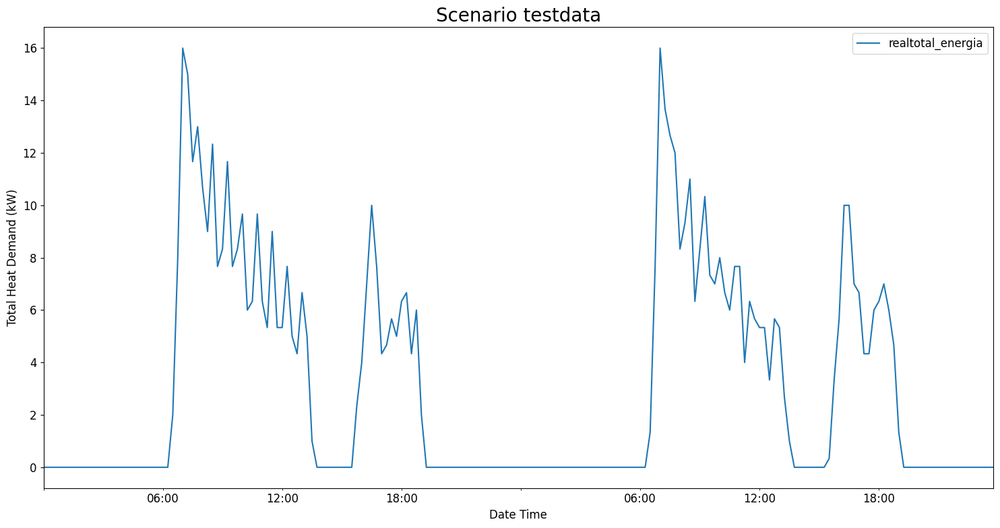

Requested range: 2023-12-27 to 2023-12-31
Available data points in queried dataset: 480
1/1 [==============================] - 0s 123ms/step
y_model0.shape (predicting 96 steps): (1, 96)
1/1 [==============================] - 0s 132ms/step
y_model0.shape (predicting 96 steps): (1, 96)

Metrics Table:


<ipython-input-7-0981359a7e0a>:145: FutureWarning:

'T' is deprecated and will be removed in a future version, please use 'min' instead.



,Metric,Value
0,Mean Absolute Error (MAE),0.060863
1,Root Mean Squared Error (RMSE),0.093334
2,R²,0.729525
3,NMBE,-2.295332
4,CVRMSE,68.404982


Target column:  realtotal_energia
The index of the target column is 22


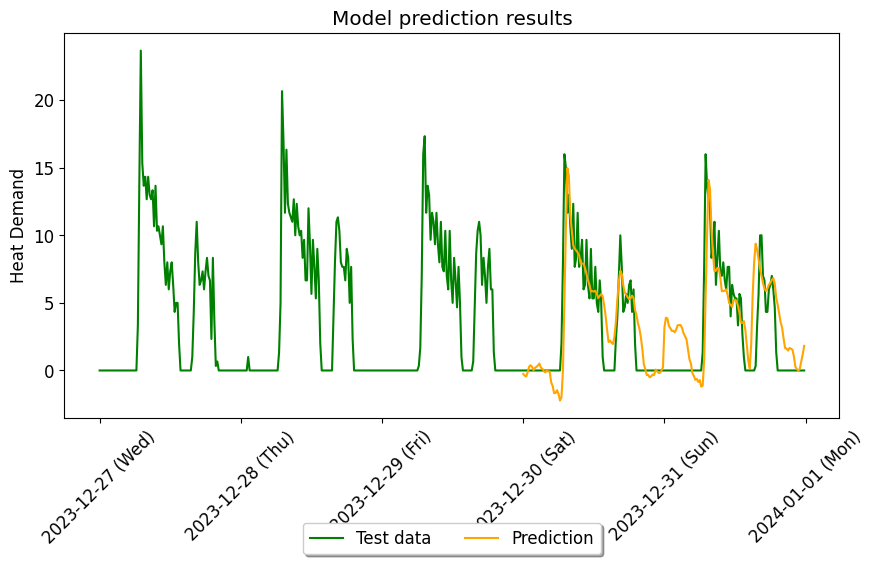

Scenario predictions saved to /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_validation/ees2_scenario_predictions_2023-12-30_2023-12-31.csv


In [35]:
# Define the date range for the Standard and Scenario data to predict 2 days from past-history = 3 days
start_date_noscenario = "2023-12-30" # datos reales sin escenarios:"2024-01-18"
end_date_noscenario = "2023-12-31"# datos reales sin escenarios:"2024-01-19"

start_date_scenario = "2023-12-30"
end_date_scenario = "2023-12-31"

# Set the number of future days for prediction (5 days = 480 steps, but using 2 days here)
future_days = 2  # Adjust as needed

# Standard data Plotting and Prediction
print("Standard data\n")
subset_query_noscenario = f'date_time.between("{start_date_noscenario} 00:00:00","{end_date_noscenario} 23:45:00")'
df_sub_noscenario = ep_data_df.query(subset_query_noscenario)
display(df_sub_noscenario)
#y_variable_noscenario = ep_data_df.columns[-1]

# Define the output file path for the Standard data
output_file_path = os.path.join(validation_folder, f"baselinees2_noscenario_testdata_{start_date_noscenario}_{end_date_noscenario}.png")

# Use matplotlib to save and display the figure for Scenario data
fig, ax = plt.subplots(figsize=(15, 8))
df_sub_noscenario.plot(ax=ax, y='simheatdemand_total', title='Baseline testdata')
ax.set_xlabel('Date Time')
ax.set_ylabel('Total Heat Demand (kW)')
plt.title('Baseline testdata', fontsize=20)

# Customizing the x-axis labels
ax.xaxis.set_major_locator(DayLocator())  # Set ticks at the beginning of each day (00:00)
date_formatter = DateFormatter('%Y-%m-%d (%a)')  # Format date with day of the week
ax.xaxis.set_major_formatter(date_formatter)  # Set x-axis formatter

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Apply tight layout, save the plot, and display it
plt.tight_layout()
plt.savefig(output_file_path)  # Save the plot
plt.show()  # Display the plot on the screen

# ** Call rolling_prediction_return_noscenario for Standard data (2 days prediction) **
noscenario_predictions, predicted_time_range_noscenario = rolling_prediction_return_noscenario(
    ep_data_df, start_date_noscenario, end_date_noscenario, model_noscenario, f_scaler, multivariate_data_multitarget, future_days=future_days
)

# Save Standard predictions to CSV
noscenario_output_df = pd.DataFrame({'Predicted': noscenario_predictions}, index=predicted_time_range_noscenario)
noscenario_output_file = os.path.join(validation_folder, f'baselinees2_noscenario_predictions_{start_date_noscenario}_{end_date_noscenario}.csv')
noscenario_output_df.to_csv(noscenario_output_file)
print(f"Standard predictions saved to {noscenario_output_file}")

# Scenario Data Plotting and Prediction
print("\nScenario data\n")
subset_query_scenario = f'date_time.between("{start_date_scenario} 00:00:00","{end_date_scenario} 23:45:00")'
df_sub_scenario = real_data_df.query(subset_query_scenario)

# Define the output file path for the Scenario data
output_file_path = os.path.join(validation_folder, f"ees2_scenario_testdata_{start_date_scenario}_{end_date_scenario}.png")

# Use matplotlib to save and display the figure for Scenario data
fig, ax = plt.subplots(figsize=(15, 8))
df_sub_scenario.plot(ax=ax, y='realtotal_energia', title='Scenario testdata')
ax.set_xlabel('Date Time')
ax.set_ylabel('Total Heat Demand (kW)')
plt.title('Scenario testdata', fontsize=20)

# Customizing the x-axis labels
ax.xaxis.set_major_locator(DayLocator())  # Set ticks at the beginning of each day (00:00)
date_formatter = DateFormatter('%Y-%m-%d (%a)')  # Format date with day of the week
ax.xaxis.set_major_formatter(date_formatter)  # Set x-axis formatter

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Apply tight layout, save the plot, and display it
plt.tight_layout()
plt.savefig(output_file_path)  # Save the plot
plt.show()  # Display the plot on the screen

# ** Call rolling_prediction_return_scenario for Scenario data (2 days prediction) **
scenario_predictions, predicted_time_range_scenario = rolling_prediction_return_scenario(
    real_data_df, start_date_scenario, end_date_scenario, model_scenario, f_scaler, multivariate_data_multitarget, future_days=future_days
)

# Save Scenario predictions to CSV
scenario_output_df = pd.DataFrame({'Predicted': scenario_predictions}, index=predicted_time_range_scenario)
scenario_output_file = os.path.join(validation_folder, f'ees2_scenario_predictions_{start_date_scenario}_{end_date_scenario}.csv')
scenario_output_df.to_csv(scenario_output_file)
print(f"Scenario predictions saved to {scenario_output_file}")


### Plotting predicted 2 days for scenario 2

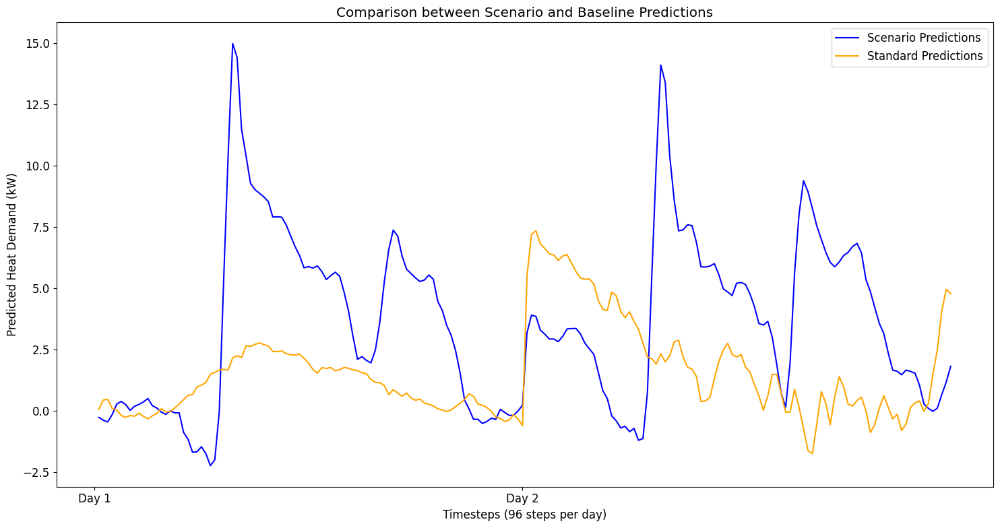

In [36]:
# Define the validation folder path

# Define paths to the CSV files for Scenario and Standard predictions
scenario_predictions_file = os.path.join(validation_folder,  f"ees2_scenario_predictions_{start_date_scenario}_{end_date_scenario}.csv")
noscenario_predictions_file = os.path.join(validation_folder, f"baselinees2_noscenario_predictions_{start_date_noscenario}_{end_date_noscenario}.csv")

# Load Scenario and Standard predictions from CSV files
df_scenario_predictions = pd.read_csv(scenario_predictions_file, index_col=0, parse_dates=True)
df_noscenario_predictions = pd.read_csv(noscenario_predictions_file, index_col=0, parse_dates=True)

# Ensure we're only working with 3 days of data (192 timesteps for 2 days)
df_scenario_predictions = df_scenario_predictions.head(192)
df_noscenario_predictions = df_noscenario_predictions.head(192)

# Create a generic time scale for both datasets (1 to 193 timesteps)
time_labels = pd.Series([i for i in range(1, 193)])

# Plot both scenario and standard predictions
plt.figure(figsize=(15, 8))

# Plot the Scenario predictions
plt.plot(time_labels, df_scenario_predictions['Predicted'], label='Scenario Predictions', color='blue')

# Plot the Standardpredictions
plt.plot(time_labels, df_noscenario_predictions['Predicted'], label='Standard Predictions', color='orange')

# Customize the plot
plt.xlabel('Timesteps (96 steps per day)')
plt.ylabel('Predicted Heat Demand (kW)')
plt.title('Comparison between Scenario and Baseline Predictions')

# Adjust x-axis to show ticks for each day (96 timesteps per day)
#day_labels = ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5']
day_labels = ['Day 1', 'Day 2']
plt.xticks([96 * i for i in range(2)], day_labels)

# Add a legend
plt.legend()

# Apply tight layout and display the plot
plt.tight_layout()
plt.show()


### Energy reduction between different time series (scenario 2 and baseline)

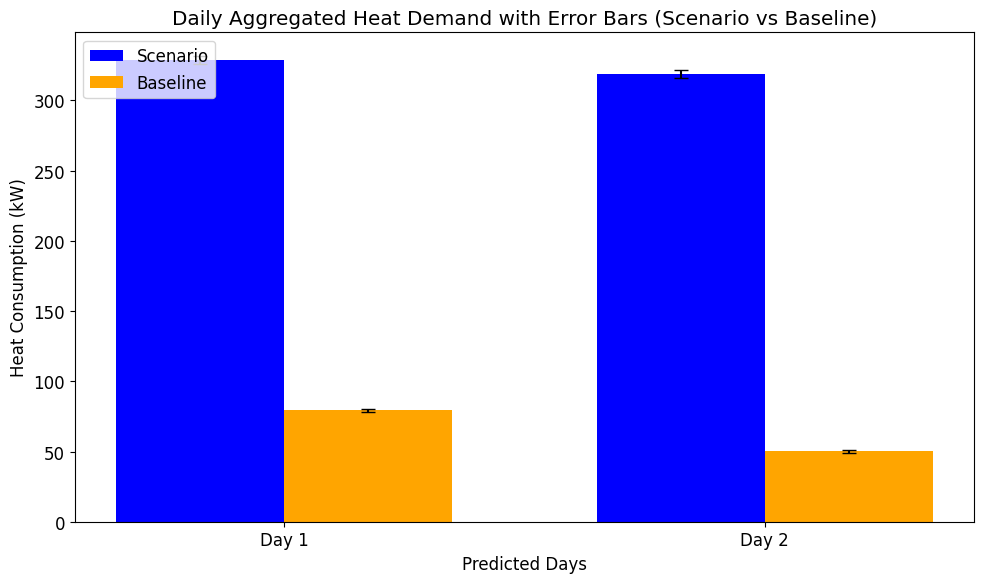


Mean Daily Energy Reduction and Associated Error:
Mean Daily Energy Reduction (%): -425.62
Mean Daily Error (%): -8.58

Daily Aggregated Heat Demand (Scenario vs Baseline) with Errors:


Day,Scenario Heat Demand (kW),Scenario Standard Deviation (kW),Baseline Heat Demand (kW),Baseline Standard Deviation (kW),Energy Reduction (%),Reduction Error (%)
Day 1,329.10,2.81,79.24,0.85,-315.32,-4.33
Day 2,318.96,2.63,50.16,1.13,-535.93,-12.82


In [37]:
# Filter the data between 7:00 a.m. and 8:00 p.m. each day
df_scenario_filtered = df_scenario_predictions.between_time("07:00", "20:00")
df_noscenario_filtered = df_noscenario_predictions.between_time("07:00", "20:00")

# Aggregate data daily (96 timesteps per day) to get daily sum and standard deviation
df_scenario_daily = df_scenario_filtered.resample('D').agg(['sum', 'std']).iloc[:5]
df_noscenario_daily = df_noscenario_filtered.resample('D').agg(['sum', 'std']).iloc[:5]

# Renaming columns for better readability
df_scenario_daily.columns = ['Scenario Heat Demand (kW)', 'Scenario Standard Deviation (kW)']
df_noscenario_daily.columns = ['Baseline Heat Demand (kW)', 'Baseline Standard Deviation (kW)']

# Combine both DataFrames for comparison
df_combined = pd.concat([df_scenario_daily.reset_index(drop=True), df_noscenario_daily.reset_index(drop=True)], axis=1)

# Add Day labels and Day of the Week for clarity
#df_combined['Day of the Week'] = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_combined['Day of the Week'] = ['Day 1', 'Day 2']
# Plotting Daily Aggregated Demand with Error Bars
#days = ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5']
days = ['Day 1', 'Day 2']

width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(days))  # the label locations

# Plot scenario and baseline data with error bars
rects1 = ax.bar(x - width/2, df_combined['Scenario Heat Demand (kW)'], width, label='Scenario',
                yerr=df_combined['Scenario Standard Deviation (kW)'], capsize=5, color='blue')
rects2 = ax.bar(x + width/2, df_combined['Baseline Heat Demand (kW)'], width, label='Baseline',
                yerr=df_combined['Baseline Standard Deviation (kW)'], capsize=5, color='orange')

# Add labels and title
ax.set_xlabel('Predicted Days')
ax.set_ylabel('Heat Consumption (kW)')
ax.set_title('Daily Aggregated Heat Demand with Error Bars (Scenario vs Baseline)')
ax.set_xticks(x)
ax.set_xticklabels(days)
ax.legend(loc='upper left')

fig.tight_layout()
plt.show()

# --- Energy Reduction Calculation ---

# Calculate the daily energy reduction percentage and associated error
df_combined['Energy Reduction (%)'] = (
    (df_combined['Baseline Heat Demand (kW)'] - df_combined['Scenario Heat Demand (kW)'])
    / df_combined['Baseline Heat Demand (kW)'] * 100
)

# Error propagation for percentage reduction (simplified)
df_combined['Reduction Error (%)'] = (
    (df_combined['Baseline Standard Deviation (kW)'] / df_combined['Baseline Heat Demand (kW)']) ** 2 +
    (df_combined['Scenario Standard Deviation (kW)'] / df_combined['Scenario Heat Demand (kW)']) ** 2
) ** 0.5 * df_combined['Energy Reduction (%)']

# --- Mean Energy Reduction and Error ---
mean_energy_reduction = df_combined['Energy Reduction (%)'].mean()
mean_reduction_error = df_combined['Reduction Error (%)'].mean()

# Display Mean Energy Reduction and Error
print("\nMean Daily Energy Reduction and Associated Error:")
print(f"Mean Daily Energy Reduction (%): {mean_energy_reduction:.2f}")
print(f"Mean Daily Error (%): {mean_reduction_error:.2f}")

# Remove the existing 'Day of the Week' column if it exists
df_combined.drop(columns=['Day of the Week'], inplace=True)

# Reinsert the 'Day' column at the first position, keeping the 'Day 1', 'Day 2', etc. labels
#df_combined.insert(0, 'Day', ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5'])
df_combined.insert(0, 'Day', ['Day 1', 'Day 2'])


# Display the modified DataFrame with the correct order of columns and without the numerical index
print("\nDaily Aggregated Heat Demand (Scenario vs Baseline) with Errors:")
df_combined.style.hide(axis="index").format(precision=2)


## EES3) Predict 2 days scenario 3

* Escenarios: 2024-01-1->5   (de lunes a viernes)
* Noscenarios: 2024-01-08->12; 2024-01-15->19; 2024-01-22->26 (de lunes a viernes)


* Simulaciones: 2018-12-31-> 2019-01-04 (de lunes a viernes)


Standard data



,Dry Bulb Temperature,Global Horizontal Radiation,Relative Humidity,Liquid Precipitation Depth,Wind Direction,Wind Speed,eptemp_SALAPROFESORES,eptemp_DESPACHOX1,eptemp_DESPACHOX2,eptemp_DESPACHOX3,...,eptemp_DESPACHOX4,eptemp_DESPACHOX5,eptemp_SECRETARIA,eptemp_DX9,eptemp_DESPACHOCAPELLAN,is_holiday,simsetheat_DESPACHOX2,simsetheat_SECRETARIA,simsetheat_SALAPROFESORES,simheatdemand_total
date_time,,,,,,,,,,,,,,,,,,,,,
2024-01-04 00:00:00,2.796000,0.667333,95.512000,0.000000,3.150667,0.337133,18.520168,20.387265,20.297696,19.926966,...,19.981074,20.172016,20.206383,19.532046,18.667197,True,15,17,15,0.0
2024-01-04 00:15:00,2.654667,0.670000,95.703333,0.000000,19.540000,0.339867,18.381034,20.281047,20.207885,19.831891,...,19.866795,20.105424,20.096843,19.411868,18.528473,True,15,17,15,0.0
2024-01-04 00:30:00,2.513333,0.669333,95.719333,0.000000,12.500000,0.388667,18.250885,20.178584,20.121385,19.740255,...,19.756575,20.041405,19.990666,19.296816,18.396314,True,15,17,15,0.0
2024-01-04 00:45:00,2.350000,0.664667,95.718667,0.000000,36.121333,0.422800,18.125313,20.078472,20.036281,19.650289,...,19.649530,19.978384,19.887551,19.185408,18.267156,True,15,17,15,0.0
2024-01-04 01:00:00,2.344667,0.672000,95.937333,0.000000,89.100667,0.496667,18.004453,19.981223,19.953219,19.562352,...,19.545994,19.916666,19.787861,19.078011,18.142419,True,15,17,15,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-05 22:45:00,4.059333,0.686000,89.282667,0.026667,139.706000,1.186467,19.189289,20.825852,20.599710,20.320792,...,20.466392,20.466359,20.675397,20.049674,19.267264,True,15,17,15,0.0
2024-01-05 23:00:00,4.204000,0.688000,88.061333,0.040000,112.695333,1.520933,19.015928,20.706653,20.501716,20.212152,...,20.335764,20.387754,20.544625,19.901546,19.105851,True,15,17,15,0.0
2024-01-05 23:15:00,4.144000,0.696000,88.049333,0.013333,183.990667,1.232333,18.857463,20.589730,20.404950,20.106495,...,20.204997,20.312253,20.419301,19.757871,18.945329,True,15,17,15,0.0


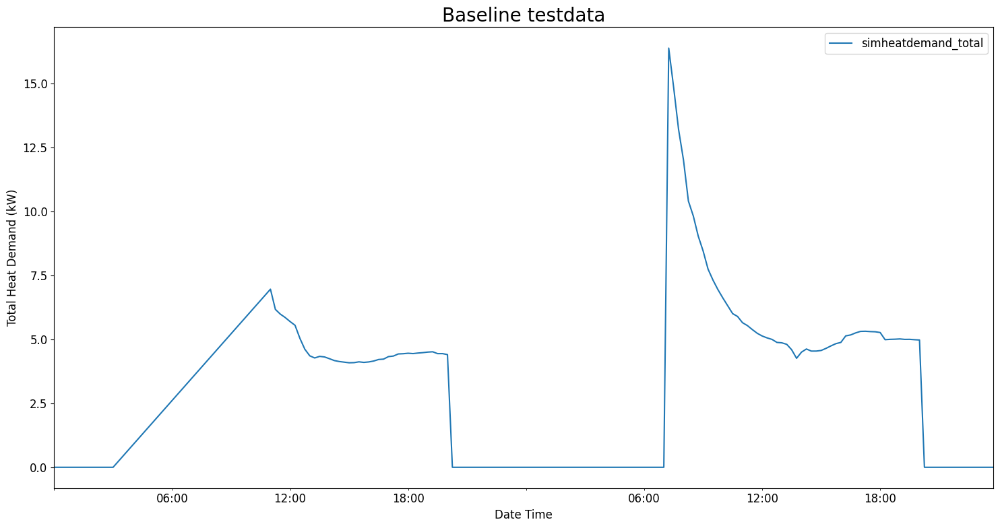

Requested range: 2024-01-01 to 2024-01-05
Available data points in queried dataset: 480
1/1 [==============================] - 0s 76ms/step
y_model0.shape (predicting 96 steps): (1, 96)
1/1 [==============================] - 0s 68ms/step
y_model0.shape (predicting 96 steps): (1, 96)

Metrics Table:


<ipython-input-7-0981359a7e0a>:41: FutureWarning:

'T' is deprecated and will be removed in a future version, please use 'min' instead.



,Metric,Value
0,Mean Absolute Error (MAE),0.102021
1,Root Mean Squared Error (RMSE),0.128118
2,R²,0.363248
3,NMBE,55.952498
4,CVRMSE,84.004288


Target column:  simheatdemand_total
The index of the target column is 22


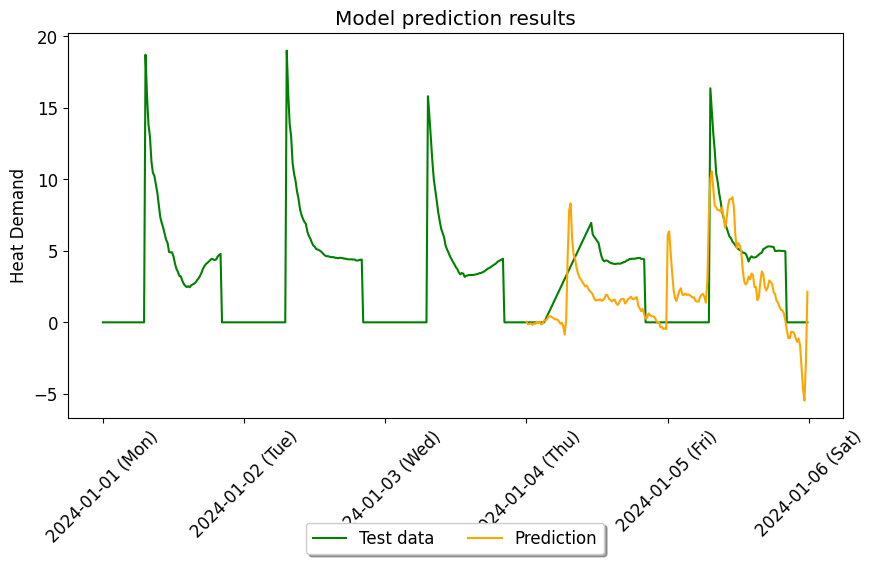

Standard predictions saved to /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_validation/baselinees3_noscenario_predictions_2024-01-04_2024-01-05.csv

Scenario data



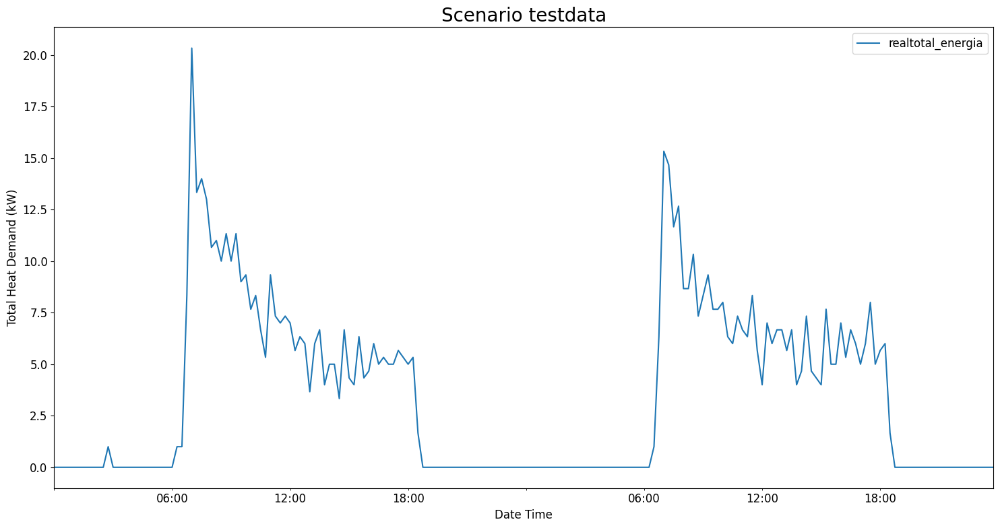

Requested range: 2024-01-01 to 2024-01-05
Available data points in queried dataset: 480
1/1 [==============================] - 0s 254ms/step
y_model0.shape (predicting 96 steps): (1, 96)
1/1 [==============================] - 0s 266ms/step
y_model0.shape (predicting 96 steps): (1, 96)

Metrics Table:


<ipython-input-7-0981359a7e0a>:145: FutureWarning:

'T' is deprecated and will be removed in a future version, please use 'min' instead.



,Metric,Value
0,Mean Absolute Error (MAE),0.084257
1,Root Mean Squared Error (RMSE),0.139962
2,R²,0.731773
3,NMBE,33.444192
4,CVRMSE,77.615734


Target column:  realtotal_energia
The index of the target column is 22


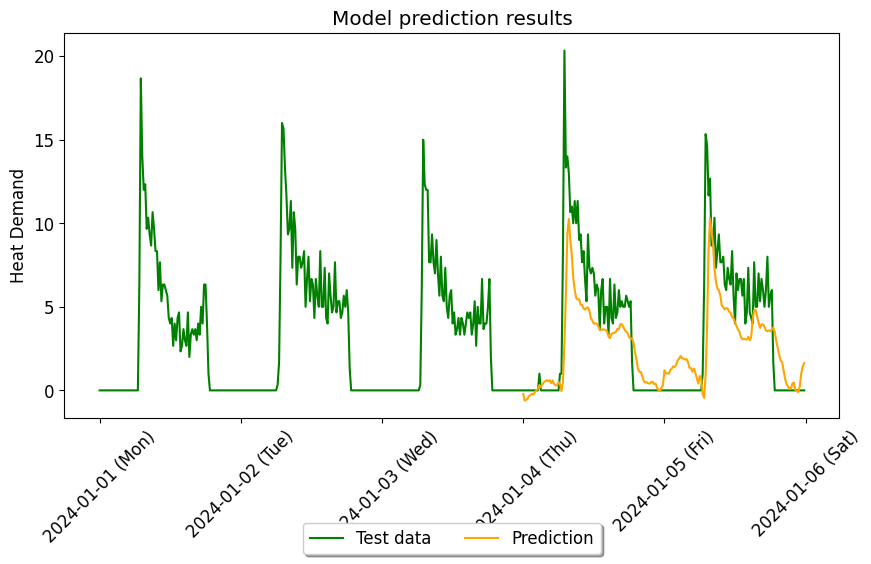

Scenario predictions saved to /content/drive/My Drive/BuildTwin/LSTM_hybrid_model/codigosmodelado0924/predictions/model_3layers_10epochs_02dropout_linearactiv_3days_brcm_E_validation/ees3_scenario_predictions_2024-01-04_2024-01-05.csv


In [38]:
# Define the date range for the Standard and Scenario data to predict 2 days from past-history = 3 days
start_date_noscenario = "2024-01-04"#datos reales sin escenarios:"2024-01-18"
end_date_noscenario = "2024-01-05"#datos reales sin escenarios:"2024-01-19"

start_date_scenario = "2024-01-04"
end_date_scenario = "2024-01-05"


# Set the number of future days for prediction (5 days = 480 steps, but using 2 days here)
future_days = 2  # Adjust as needed

# Standard data Plotting and Prediction
print("Standard data\n")
subset_query_noscenario = f'date_time.between("{start_date_noscenario} 00:00:00","{end_date_noscenario} 23:45:00")'
df_sub_noscenario = ep_data_df.query(subset_query_noscenario)
display(df_sub_noscenario)
#y_variable_noscenario = ep_data_df.columns[-1]

# Define the output file path for the Standard data
output_file_path = os.path.join(validation_folder, f"baselinees3_noscenario_testdata_{start_date_noscenario}_{end_date_noscenario}.png")

# Use matplotlib to save and display the figure for Scenario data
fig, ax = plt.subplots(figsize=(15, 8))
df_sub_noscenario.plot(ax=ax, y='simheatdemand_total', title='Baseline testdata')
ax.set_xlabel('Date Time')
ax.set_ylabel('Total Heat Demand (kW)')
plt.title('Baseline testdata', fontsize=20)

# Customizing the x-axis labels
ax.xaxis.set_major_locator(DayLocator())  # Set ticks at the beginning of each day (00:00)
date_formatter = DateFormatter('%Y-%m-%d (%a)')  # Format date with day of the week
ax.xaxis.set_major_formatter(date_formatter)  # Set x-axis formatter

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Apply tight layout, save the plot, and display it
plt.tight_layout()
plt.savefig(output_file_path)  # Save the plot
plt.show()  # Display the plot on the screen

# ** Call rolling_prediction_return_noscenario for Standard data (2 days prediction) **
noscenario_predictions, predicted_time_range_noscenario = rolling_prediction_return_noscenario(
    ep_data_df, start_date_noscenario, end_date_noscenario, model_noscenario, f_scaler, multivariate_data_multitarget, future_days=future_days
)

# Save Standard predictions to CSV
noscenario_output_df = pd.DataFrame({'Predicted': noscenario_predictions}, index=predicted_time_range_noscenario)
noscenario_output_file = os.path.join(validation_folder, f'baselinees3_noscenario_predictions_{start_date_noscenario}_{end_date_noscenario}.csv')
noscenario_output_df.to_csv(noscenario_output_file)
print(f"Standard predictions saved to {noscenario_output_file}")

# Scenario Data Plotting and Prediction
print("\nScenario data\n")
subset_query_scenario = f'date_time.between("{start_date_scenario} 00:00:00","{end_date_scenario} 23:45:00")'
df_sub_scenario = real_data_df.query(subset_query_scenario)

# Define the output file path for the Scenario data
output_file_path = os.path.join(validation_folder, f"ees3_scenario_testdata_{start_date_scenario}_{end_date_scenario}.png")

# Use matplotlib to save and display the figure for Scenario data
fig, ax = plt.subplots(figsize=(15, 8))
df_sub_scenario.plot(ax=ax, y='realtotal_energia', title='Scenario testdata')
ax.set_xlabel('Date Time')
ax.set_ylabel('Total Heat Demand (kW)')
plt.title('Scenario testdata', fontsize=20)

# Customizing the x-axis labels
ax.xaxis.set_major_locator(DayLocator())  # Set ticks at the beginning of each day (00:00)
date_formatter = DateFormatter('%Y-%m-%d (%a)')  # Format date with day of the week
ax.xaxis.set_major_formatter(date_formatter)  # Set x-axis formatter

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Apply tight layout, save the plot, and display it
plt.tight_layout()
plt.savefig(output_file_path)  # Save the plot
plt.show()  # Display the plot on the screen

# ** Call rolling_prediction_return_scenario for Scenario data (2 days prediction) **
scenario_predictions, predicted_time_range_scenario = rolling_prediction_return_scenario(
    real_data_df, start_date_scenario, end_date_scenario, model_scenario, f_scaler, multivariate_data_multitarget, future_days=future_days
)

# Save Scenario predictions to CSV
scenario_output_df = pd.DataFrame({'Predicted': scenario_predictions}, index=predicted_time_range_scenario)
scenario_output_file = os.path.join(validation_folder, f'ees3_scenario_predictions_{start_date_scenario}_{end_date_scenario}.csv')
scenario_output_df.to_csv(scenario_output_file)
print(f"Scenario predictions saved to {scenario_output_file}")


### Plotting predicted 2 days for scenario 3

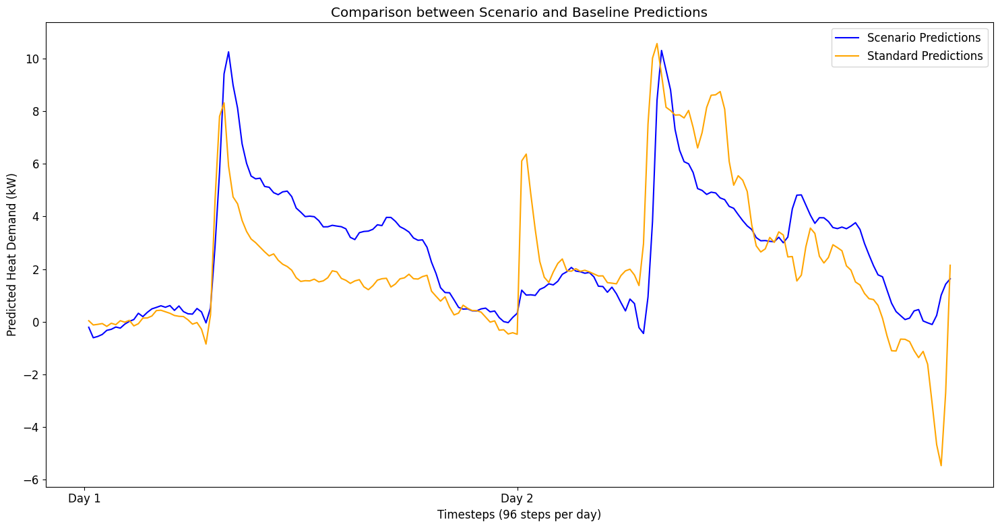

In [39]:
# Define the validation folder path

# Define paths to the CSV files for Scenario and Standard predictions
scenario_predictions_file = os.path.join(validation_folder,  f"ees3_scenario_predictions_{start_date_scenario}_{end_date_scenario}.csv")
noscenario_predictions_file = os.path.join(validation_folder, f"baselinees3_noscenario_predictions_{start_date_noscenario}_{end_date_noscenario}.csv")

# Load Scenario and Standard predictions from CSV files
df_scenario_predictions = pd.read_csv(scenario_predictions_file, index_col=0, parse_dates=True)
df_noscenario_predictions = pd.read_csv(noscenario_predictions_file, index_col=0, parse_dates=True)

# Ensure we're only working with 3 days of data (192 timesteps for 2 days)
df_scenario_predictions = df_scenario_predictions.head(192)
df_noscenario_predictions = df_noscenario_predictions.head(192)

# Create a generic time scale for both datasets (1 to 193 timesteps)
time_labels = pd.Series([i for i in range(1, 193)])

# Plot both scenario and standard predictions
plt.figure(figsize=(15, 8))

# Plot the Scenario predictions
plt.plot(time_labels, df_scenario_predictions['Predicted'], label='Scenario Predictions', color='blue')

# Plot the Standardpredictions
plt.plot(time_labels, df_noscenario_predictions['Predicted'], label='Standard Predictions', color='orange')

# Customize the plot
plt.xlabel('Timesteps (96 steps per day)')
plt.ylabel('Predicted Heat Demand (kW)')
plt.title('Comparison between Scenario and Baseline Predictions')

# Adjust x-axis to show ticks for each day (96 timesteps per day)
#day_labels = ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5']
day_labels = ['Day 1', 'Day 2']
plt.xticks([96 * i for i in range(2)], day_labels)

# Add a legend
plt.legend()

# Apply tight layout and display the plot
plt.tight_layout()
plt.show()


### Energy reduction between different time series (scenario 3 and baseline)

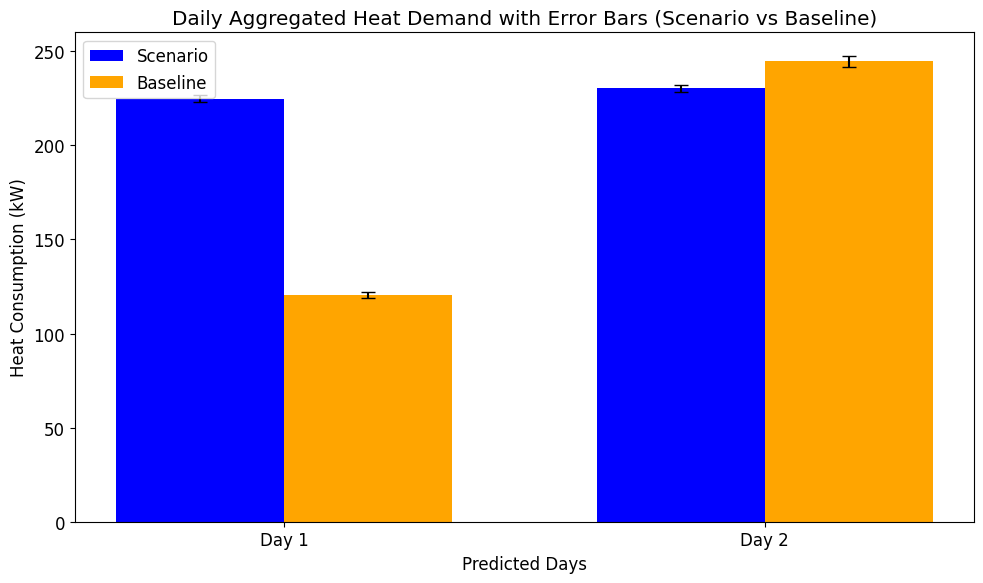


Mean Daily Energy Reduction and Associated Error:
Mean Daily Energy Reduction (%): -40.25
Mean Daily Error (%): -0.62

Daily Aggregated Heat Demand (Scenario vs Baseline) with Errors:


Day,Scenario Heat Demand (kW),Scenario Standard Deviation (kW),Baseline Heat Demand (kW),Baseline Standard Deviation (kW),Energy Reduction (%),Reduction Error (%)
Day 1,224.66,1.84,120.50,1.57,-86.43,-1.33
Day 2,230.24,1.85,244.74,2.92,5.92,0.09


In [40]:
# Filter the data between 7:00 a.m. and 8:00 p.m. each day
df_scenario_filtered = df_scenario_predictions.between_time("07:00", "20:00")
df_noscenario_filtered = df_noscenario_predictions.between_time("07:00", "20:00")

# Aggregate data daily (96 timesteps per day) to get daily sum and standard deviation
df_scenario_daily = df_scenario_filtered.resample('D').agg(['sum', 'std']).iloc[:5]
df_noscenario_daily = df_noscenario_filtered.resample('D').agg(['sum', 'std']).iloc[:5]

# Renaming columns for better readability
df_scenario_daily.columns = ['Scenario Heat Demand (kW)', 'Scenario Standard Deviation (kW)']
df_noscenario_daily.columns = ['Baseline Heat Demand (kW)', 'Baseline Standard Deviation (kW)']

# Combine both DataFrames for comparison
df_combined = pd.concat([df_scenario_daily.reset_index(drop=True), df_noscenario_daily.reset_index(drop=True)], axis=1)

# Add Day labels and Day of the Week for clarity
#df_combined['Day of the Week'] = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_combined['Day of the Week'] = ['Day 1', 'Day 2']
# Plotting Daily Aggregated Demand with Error Bars
#days = ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5']
days = ['Day 1', 'Day 2']

width = 0.35  # the width of the bars
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(days))  # the label locations

# Plot scenario and baseline data with error bars
rects1 = ax.bar(x - width/2, df_combined['Scenario Heat Demand (kW)'], width, label='Scenario',
                yerr=df_combined['Scenario Standard Deviation (kW)'], capsize=5, color='blue')
rects2 = ax.bar(x + width/2, df_combined['Baseline Heat Demand (kW)'], width, label='Baseline',
                yerr=df_combined['Baseline Standard Deviation (kW)'], capsize=5, color='orange')

# Add labels and title
ax.set_xlabel('Predicted Days')
ax.set_ylabel('Heat Consumption (kW)')
ax.set_title('Daily Aggregated Heat Demand with Error Bars (Scenario vs Baseline)')
ax.set_xticks(x)
ax.set_xticklabels(days)
ax.legend(loc='upper left')

fig.tight_layout()
plt.show()

# --- Energy Reduction Calculation ---

# Calculate the daily energy reduction percentage and associated error
df_combined['Energy Reduction (%)'] = (
    (df_combined['Baseline Heat Demand (kW)'] - df_combined['Scenario Heat Demand (kW)'])
    / df_combined['Baseline Heat Demand (kW)'] * 100
)

# Error propagation for percentage reduction (simplified)
df_combined['Reduction Error (%)'] = (
    (df_combined['Baseline Standard Deviation (kW)'] / df_combined['Baseline Heat Demand (kW)']) ** 2 +
    (df_combined['Scenario Standard Deviation (kW)'] / df_combined['Scenario Heat Demand (kW)']) ** 2
) ** 0.5 * df_combined['Energy Reduction (%)']

# --- Mean Energy Reduction and Error ---
mean_energy_reduction = df_combined['Energy Reduction (%)'].mean()
mean_reduction_error = df_combined['Reduction Error (%)'].mean()

# Display Mean Energy Reduction and Error
print("\nMean Daily Energy Reduction and Associated Error:")
print(f"Mean Daily Energy Reduction (%): {mean_energy_reduction:.2f}")
print(f"Mean Daily Error (%): {mean_reduction_error:.2f}")

# Remove the existing 'Day of the Week' column if it exists
df_combined.drop(columns=['Day of the Week'], inplace=True)

# Reinsert the 'Day' column at the first position, keeping the 'Day 1', 'Day 2', etc. labels
#df_combined.insert(0, 'Day', ['Day 1', 'Day 2', 'Day 3', 'Day 4', 'Day 5'])
df_combined.insert(0, 'Day', ['Day 1', 'Day 2'])


# Display the modified DataFrame with the correct order of columns and without the numerical index
print("\nDaily Aggregated Heat Demand (Scenario vs Baseline) with Errors:")
df_combined.style.hide(axis="index").format(precision=2)


# end